In [1]:
import xarray as xr
from utility_programs.read_routines import SAMI, GITM
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import glob
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.feature.nightshade import Nightshade

from matplotlib.dates import DateFormatter
import numpy as np
import datetime
import os
import pandas as pd
import gc
import importlib
from utility_programs import filters
from utility_programs import plotting_routines
import paperfigures

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [2]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [3]:
simstorm_datadir = '/glade/u/home/abukowski/scratch/postprocessed/'

os.listdir(simstorm_datadir)

['may_full_ut18_storm-on_SAMI_REGRID.nc',
 'may_full_ut6_storm-1hr_GITM.nc',
 'may_full_ut6_storm-on_SAMI_REGRID.nc',
 'may_storm-on_full_LND_SAMI_REGRID.nc',
 'MONTH_AMP_ONSET_storm-DURATION_XARGS_MODEL-DTYPE',
 'nov_half_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz8-bypos_ut12_storm-on_SAMI_REGRID.nc',
 'nov_ut12_full_thm_GITM.nc',
 'nov_rotB-bz8-byneg_ut12_storm-on_GITM.nc',
 'may_quarter_ut12_storm-on_GITM.nc',
 'nov_rotB-bz15-byneg_ut12_storm-on_SAMI_REGRID.nc',
 'may_half_ut12_storm-on_GITM.nc',
 'nov_rotB-bz17_ut12_storm-on_SAMI_REGRID.nc',
 'may_full_ut12_storm-on_GITM.nc',
 'nov_full_ut18_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz15-bypos_ut12_storm-on_GITM.nc',
 'nov_rotB-bz17_ut12_storm-on_GITM.nc',
 'nov_rotB-bz8-bypos_ut12_storm-on_GITM.nc',
 'may_quarter_ut12_storm-on_SAMI_REGRID.nc',
 'nov_full_ut12_storm-on_SAMI_REGRID.nc',
 'may_full_ut12_storm-on_SAMI_REGRID.nc',
 'may_half_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz8-byneg_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz15

In [4]:
samids = xr.open_mfdataset(simstorm_datadir +'may_storm-on_full_LND_SAMI_REGRID.nc', engine = 'h5netcdf')
gitmds = xr.open_mfdataset(simstorm_datadir +'may_full_ut12_storm-on_GITM.nc', engine = 'h5netcdf')

storm_start = pd.Timestamp(2011, 5, 21, 12)

In [5]:
def timedeltatotime(td, secs_back=False):
    td_in_seconds = td.total_seconds()
    hours, remainder = divmod(td_in_seconds, 3600)
    minutes, seconds = divmod(remainder, 60)
    
    hours = int(hours)
    minutes = int(minutes)
    seconds = int(seconds)
    
    if hours <= -1:
        hours += 1
        if secs_back:
            tstring = '-%s:%s:%s' %(str(np.abs(hours)).rjust(2,'0'), str(minutes).rjust(2,'0'), str(seconds).rjust(2,'0'))
        else:
            tstring = '-%s:%s' %(str(np.abs(hours)).rjust(2,'0'), str(minutes).rjust(2,'0'))
    else:
        if secs_back:
            tstring = '%s:%s:%s' %(str(hours).rjust(2,'0'), str(minutes).rjust(2,'0'), str(seconds).rjust(2,'0'))
        else:
            tstring = '%s:%s' %(str(hours).rjust(2,'0'), str(minutes).rjust(2,'0'))
    
    return tstring

# Filters available:

In [6]:
from scipy.signal import butter, sosfiltfilt, sosfilt_zi, sosfilt, lfilter, filtfilt


def filt_filt(da,
              freq=5,
              lims=[40, 85],
              order=1,
              percent=True):

    # Define sampling frequency and limits in minutes
    sampling_freq = freq
    lower_limit = min(lims)
    upper_limit = max(lims)

    # Convert limits to corresponding indices
    lower_index = int(lower_limit / sampling_freq)
    upper_index = int(upper_limit / sampling_freq)

    # Design the bandpass filter
    nyquist_freq = 0.5 * sampling_freq
    lower_cutoff = lower_index / nyquist_freq
    upper_cutoff = upper_index / nyquist_freq
    b, a = butter(order, [1/upper_cutoff, 1/lower_cutoff],
                  btype='band', analog=False)

    # Apply the filter to the data
    filtd = filtfilt(b, a, da, axis=0)
    # filtd = xr.apply_ufunc(filtfilt, b, a, da, dask='allowed')

    if percent:
        return (100*(filtd)/da)

    else:
        da.values = filtd
        return da


def sos_filt_filt(da,
                  freq=5,
                  lims=[85, 40],
                  order=1,
                  percent=True):

    sample_freq = 5  # min

    lowcut_f = 1 / (max(lims) / (60/freq))   # 85 minutes in units of sample^-1
    highcut_f = 1 / (min(lims) / (60/freq))  # 30 minutes in units of sample^-1

    # Define the Butterworth filter
    nyquist = 0.5 * freq  # 5 minutes is the sampling frequency
    low = lowcut_f / nyquist
    high = highcut_f / nyquist
    sos = butter(order, [low, high], btype="bandstop", output="sos")

    filtd = sosfiltfilt(sos, da, axis=0)

    if percent:
        return 100*(da-filtd)/da

    else:
        da.values = filtd
        return da


def diffs(da,
          pts,
          percent):

    if percent:
        return 100*(da.diff('time', pts, label='lower')/da)
    else:
        return da.diff(dim, pts, label='lower')

In [14]:
mageq_df = pd.read_csv('/glade/u/home/abukowski/mag_equator.txt', sep=' ')
mageq_df

,glon,mlat
0,0,10.7
1,5,10.6
2,10,10.5
3,15,10.3
4,20,9.9
...,...,...
68,340,9.2
69,345,9.9
70,350,10.4
71,355,10.7


In [16]:
glons_new = [i if i <=180 else i-360 for i in mageq_df['glon']]
mlats_new = [i for i in mageq_df['mlat']]

# glons_new.append(row['glon'] if )

sorted_idxs = np.argsort(glons_new)

mageq_df2 = pd.DataFrame()
mageq_df2['glon'] = np.array(glons_new)[sorted_idxs]
mageq_df2['mlat'] = np.array(mlats_new)[sorted_idxs]



# mageq_df['glon'] 

In [9]:
mageq_df

,glon,mlat
0,-175,2.3
1,-170,1.6
2,-165,0.9
3,-160,0.3
4,-155,-0.4
...,...,...
68,160,6.5
69,165,5.7
70,170,4.9
71,175,4.0


# Settings

In [10]:
storm_start = pd.Timestamp(2011, 5, 21, 12)
plot_start = pd.Timestamp(2011, 5, 21, 12, 15)
plot_delta = pd.Timedelta('30 minutes')

numplots = 6

gitm_alt = 500
gitm_lons = [0, 60, 120, 180, 240, 300]

keo_tlims = [storm_start-pd.Timedelta('3 hours'), storm_start + pd.Timedelta('8 hours')]

vlims=6

col = 'Rho'
at_alt = 550

In [11]:
do_filter = filt_filt

# FIGURES

## 1

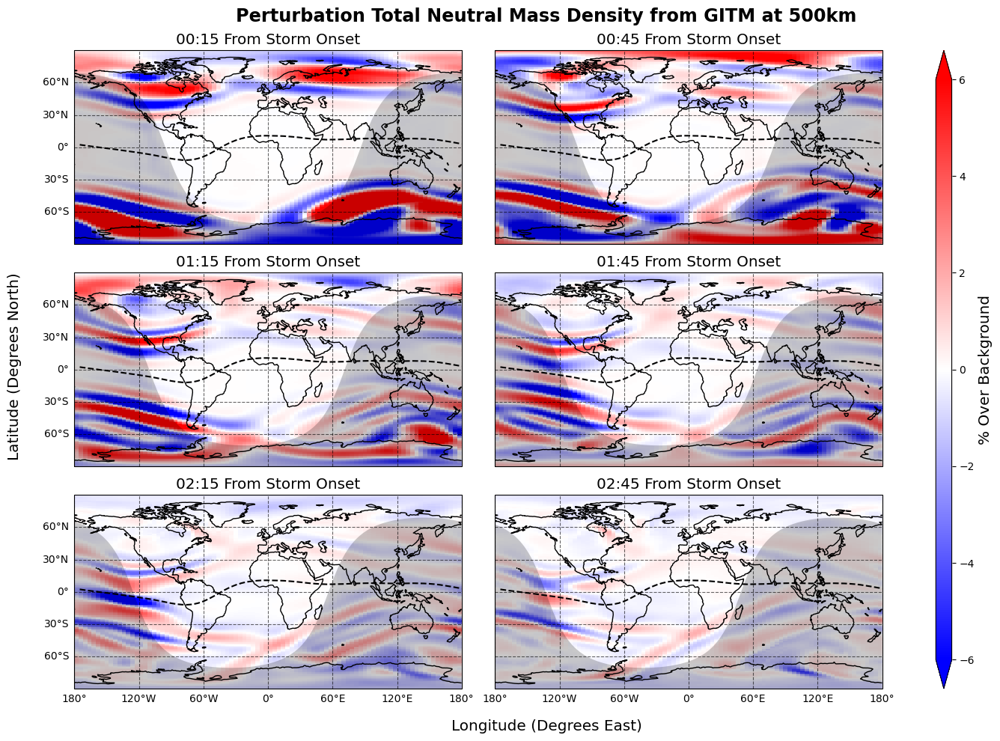

In [12]:
# map of gitm
paperfigures = importlib.reload(paperfigures)

figure1 = paperfigures.fig1(
    ds=do_filter(gitmds.Rho.sel(alt=gitm_alt, method='nearest')),
    vlims=vlims,
    plot_start=plot_start,
    plot_delta=plot_delta,
    storm_start=storm_start,
    at_alt=gitm_alt,
    mag_eq=mageq_df2,
)
figure1.show()

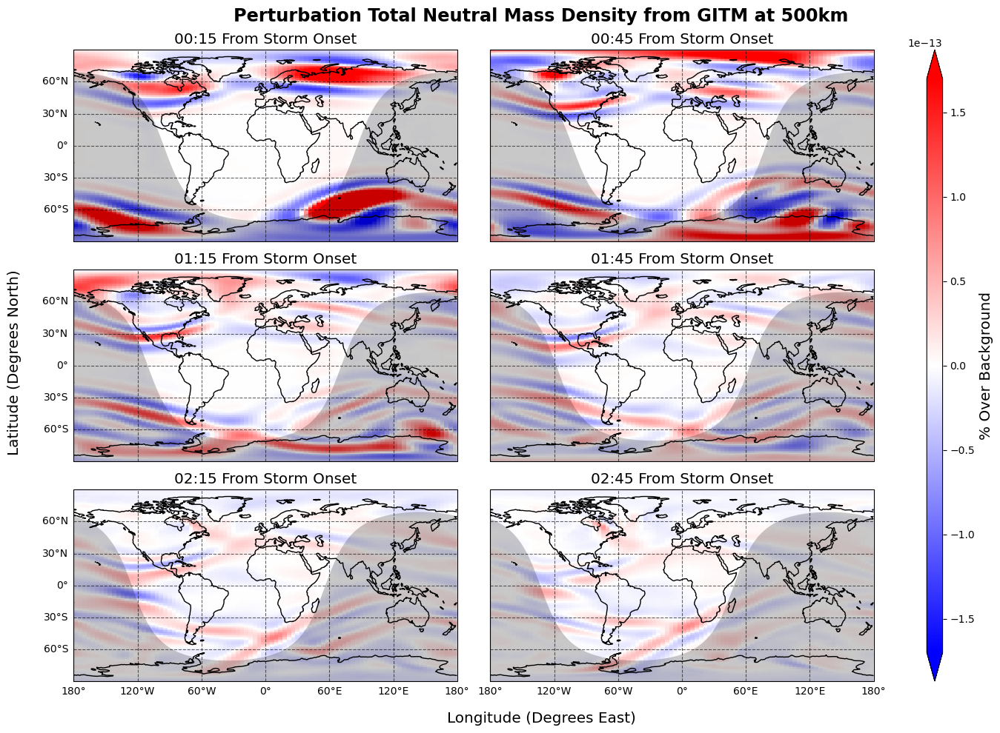

In [17]:
# map of gitm
paperfigures = importlib.reload(paperfigures)

figure1 = paperfigures.fig1(
    ds=do_filter(gitmds.Rho.sel(alt=gitm_alt, method='nearest'), percent=False),
    vlims=1.7e-13,
    plot_start=plot_start,
    plot_delta=plot_delta,
    storm_start=storm_start,
    at_alt=gitm_alt
)

#### ABSOLUTE PERTURBATION ####
figure1.show()

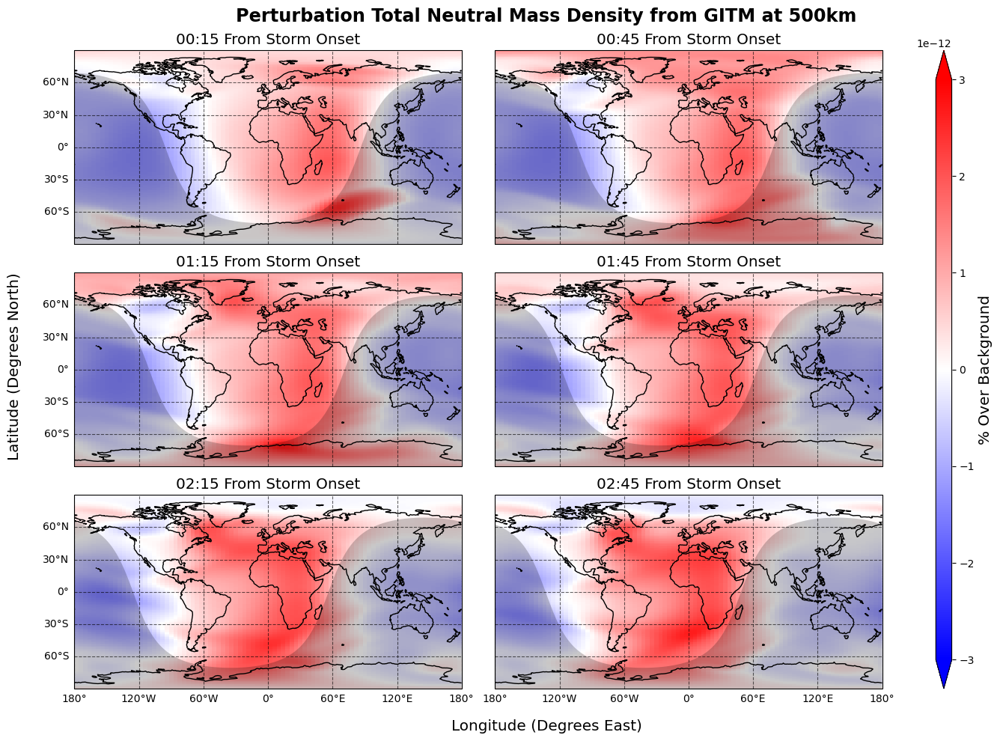

In [34]:
# map of gitm
paperfigures = importlib.reload(paperfigures)

ds=gitmds.Rho.sel(alt=gitm_alt, method='nearest').copy()


figure1 = paperfigures.fig1(
    ds=ds-ds.mean('time'),
    vlims=3e-12,
    plot_start=plot_start,
    plot_delta=plot_delta,
    storm_start=storm_start,
    at_alt=gitm_alt
)

#### ABSOLUTE PERTURBATION OVER MEAN @ EACH TIME ####
figure1.show()

In [ ]:
pd.date_range()

In [13]:
mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - 150))]

7.5

## 2

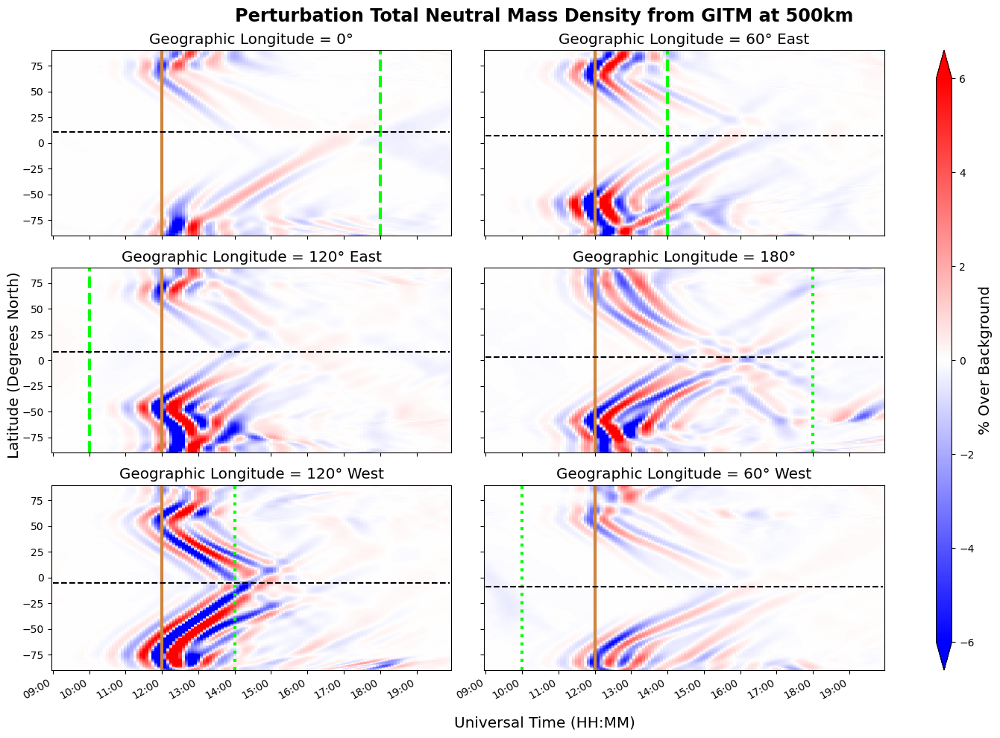

In [22]:
# gitm keo
paperfigures = importlib.reload(paperfigures)

figure2 = paperfigures.fig2(
    ds=do_filter(gitmds.Rho.sel(alt=gitm_alt,  method='nearest'), lims=[45,85],),
    tlims=keo_tlims,
    vlims=vlims,
    at_alt=500,
    lons=gitm_lons,
    mag_eq=mageq_df,
)

figure2.show()

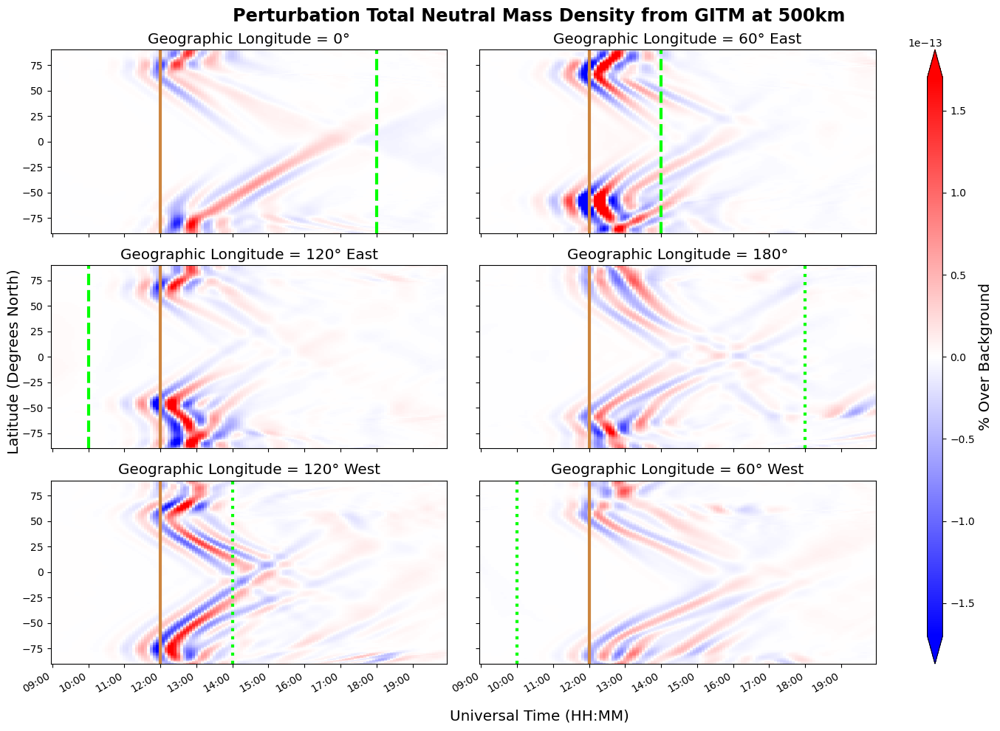

In [18]:
# gitm keo
paperfigures = importlib.reload(paperfigures)

figure2 = paperfigures.fig2(
    ds=do_filter(gitmds.Rho.sel(alt=gitm_alt,  method='nearest'), lims=[45,85], percent=False),
    tlims=keo_tlims,
    vlims=1.7e-13,
    at_alt=500,
    lons=gitm_lons,
)

figure2.show()

In [22]:
gitmds.alt

<xarray.DataArray 'alt' (alt: 50)>
array([100.      , 101.746216, 103.532765, 105.373363, 107.285464, 109.292436,
       111.427405, 113.740137, 116.302603, 119.21692 , 122.623961, 126.668746,
       131.398595, 136.877516, 143.167012, 150.316829, 158.36193 , 167.320675,
       177.194894, 187.970957, 199.623531, 212.118823, 225.417701, 239.478097,
       254.256597, 269.709314, 285.792303, 302.461687, 319.673642, 337.385286,
       355.554468, 374.140668, 393.10565 , 412.414048, 432.033808, 451.936437,
       472.097063, 492.494339, 513.110214, 533.929639, 554.940228, 576.131911,
       597.496606, 619.027909, 640.720826, 662.571535, 684.577181, 706.735708,
       729.045713, 751.506329])
Coordinates:
  * alt      (alt) float64 100.0 101.7 103.5 105.4 ... 684.6 706.7 729.0 751.5

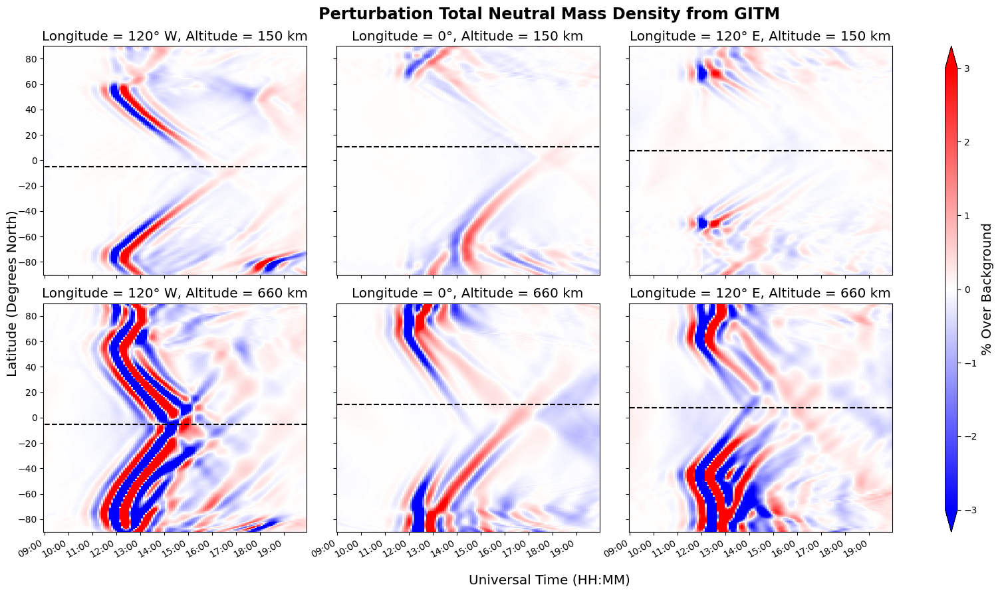

In [25]:
# gitm keo

plt.close('all')

newlon = [6, 120, 240]


fig, axs = plt.subplots(2, 3,figsize=(17, 9),
                            sharex=True,
                            sharey=True,)

axes = axs.flatten()


do_filter(gitmds.Rho.sel(lon=newlon[0], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=150, method='nearest').plot(
    ax=axes[1], x='time',robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[1].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[0]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')

do_filter(gitmds.Rho.sel(lon=newlon[1], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=150, method='nearest').plot(ax=axes[2], x='time', robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[2].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[1]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')

do_filter(gitmds.Rho.sel(lon=newlon[2], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=150, method='nearest').plot(ax=axes[0], x='time', robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[0].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[2]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')

do_filter(gitmds.Rho.sel(lon=newlon[0], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=660, method='nearest').plot(ax=axes[4], x='time', robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[4].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[0]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')

do_filter(gitmds.Rho.sel(lon=newlon[1], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=660, method='nearest').plot(ax=axes[5], x='time', robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[5].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[1]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')



im = do_filter(gitmds.Rho.sel(lon=newlon[2], method='nearest')).sel(time=slice(keo_tlims[0], keo_tlims[1])).sel(alt=660, method='nearest').plot(ax=axes[3], x='time', robust=True, cmap='bwr', vmin=-3, vmax=3, add_colorbar=False,)
axes[3].hlines(mageq_df['mlat'][np.argmin(np.abs(mageq_df['glon'] - newlon[2]))],
                keo_tlims[0], keo_tlims[1], linestyle='--', color='k')




axes[1].set_title("Longitude = 0°, Altitude = 150 km", fontsize='x-large')
axes[2].set_title("Longitude = 120° E, Altitude = 150 km", fontsize='x-large')
axes[0].set_title("Longitude = 120° W, Altitude = 150 km", fontsize='x-large')

axes[4].set_title("Longitude = 0°, Altitude = 660 km", fontsize='x-large')
axes[5].set_title("Longitude = 120° E, Altitude = 660 km", fontsize='x-large')
axes[3].set_title("Longitude = 120° W, Altitude = 660 km", fontsize='x-large')


for ax in axes:
    ax.xaxis.set_major_formatter(DateFormatter('%H:%M'))
    ax.set_ylabel('')
    ax.set_xlabel('')

fig.supxlabel('Universal Time (HH:MM)', fontsize='x-large')
fig.supylabel('Latitude (Degrees North)', fontsize='x-large')
    
fig.suptitle('Perturbation Total Neutral Mass Density from GITM',
                 fontsize='xx-large', fontweight='heavy')   
    
fig.tight_layout()    



cbar = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="vertical",
                        aspect=40, extend='both',)
cbar.set_label('% Over Background', fontsize='x-large')


fig.show()

## 3

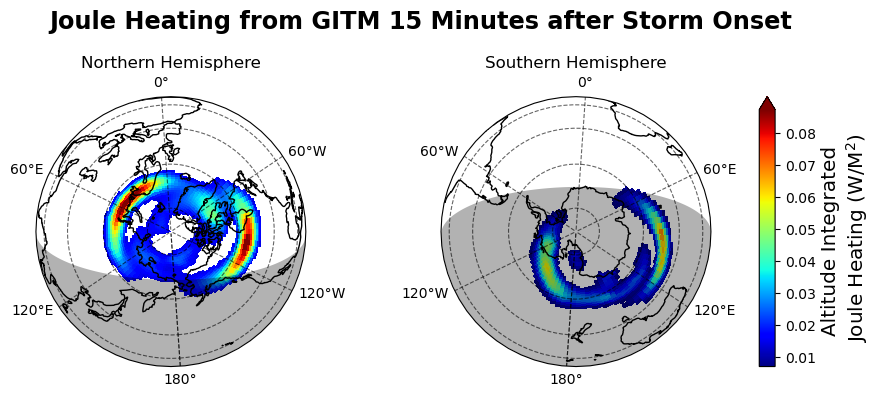

In [47]:
# JH dials
paperfigures = importlib.reload(paperfigures)

figure3 = paperfigures.fig3(
    gitmds.AltIntJouleHeating_W_m2.where(gitmds.AltIntJouleHeating_W_m2 > 0.007).sel(
        time=storm_start+pd.Timedelta('15 minutes'), method='nearest'),
    vmin=0.0,
    vmax=.08,
    suptitle='Joule Heating from GITM 15 Minutes after Storm Onset')
figure3.show()

## 4

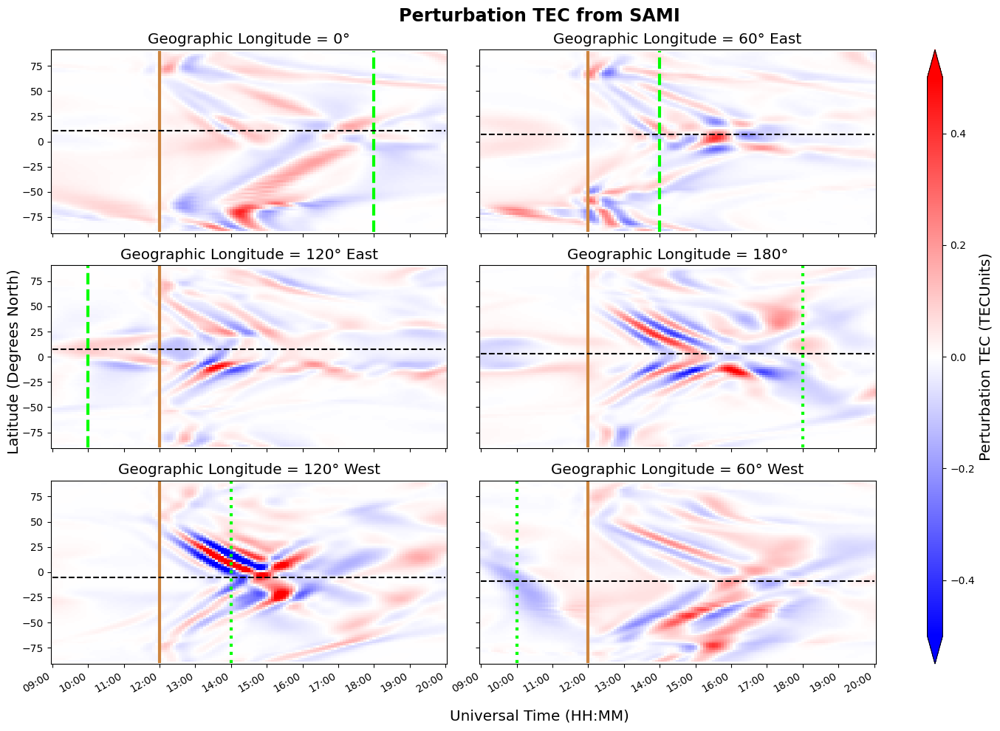

In [26]:
# sami keos
paperfigures = importlib.reload(paperfigures)

figure4 = paperfigures.fig4(
    ds=do_filter(samids.edens.integrate('alt'), percent=False)/1e7,
    tlims=keo_tlims,
    vlims=.5,
    lons=gitm_lons,
    mag_eq=mageq_df,
)
figure4.show()

## Not TEC UNITS!!!

## 5

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


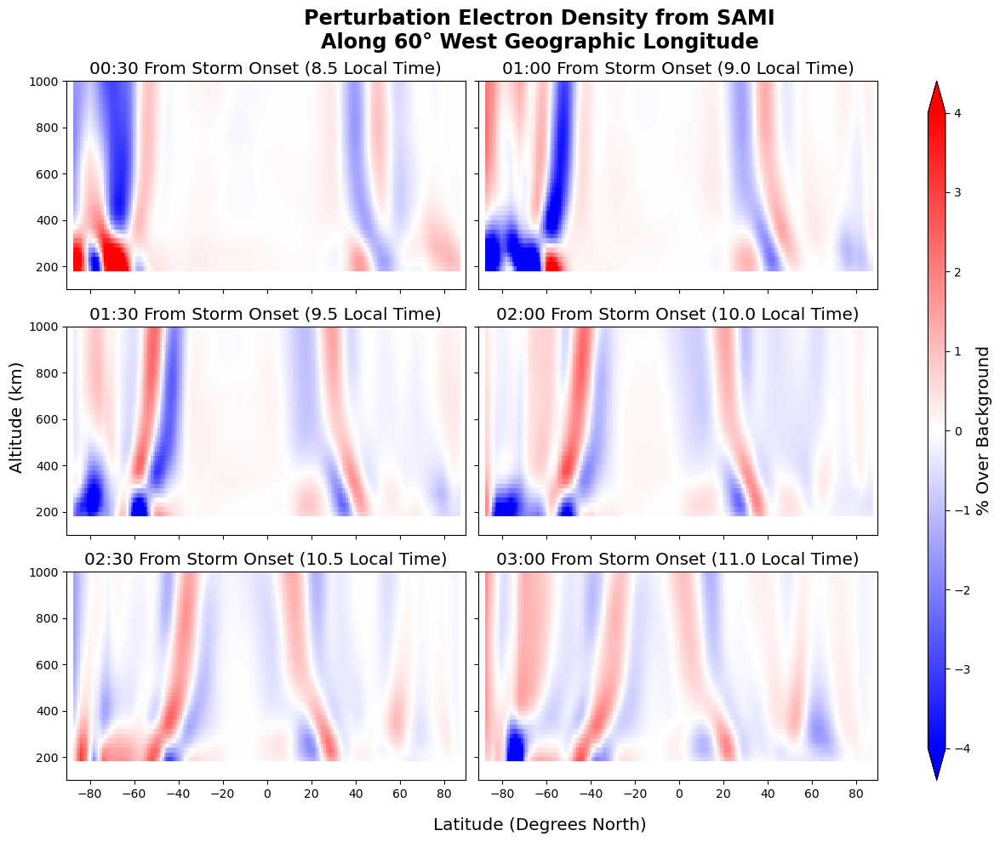

In [52]:
paperfigures = importlib.reload(paperfigures)

figure5 = paperfigures.fig5(
    ds=do_filter(samids.edens.sel(lon=300, method='nearest')),
    vlims=4,
    lon=300,
    storm_start=storm_start,
    times=[pd.Timestamp('2011-05-21 12:30') + i*pd.Timedelta('30 minutes') for i in range(6)],
)
figure5.show()

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


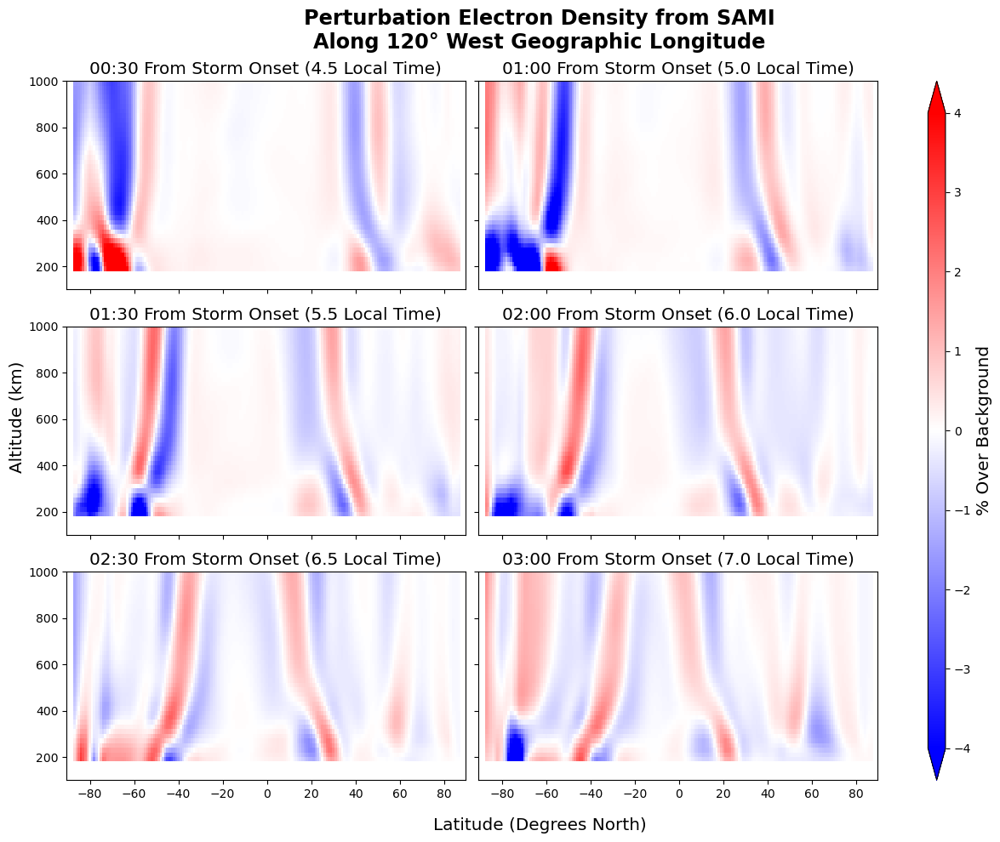

In [53]:
# sami vertical profile
paperfigures = importlib.reload(paperfigures)

figure5 = paperfigures.fig5(
    ds=do_filter(samids.edens.sel(lon=300, method='nearest')),
    vlims=4,
    lon=240,
    storm_start=storm_start,
    times=[pd.Timestamp('2011-05-21 12:30') + i*pd.Timedelta('30 minutes') for i in range(6)],
)
figure5.show()


## 6 ?

sami @ 800km map?

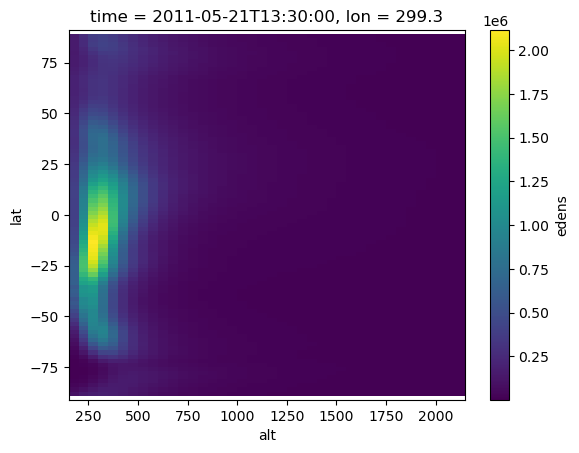

In [17]:
samids.edens.sel(time='2011-5-21 13:30', lon=300,  method='nearest').plot()

In [5]:
os.listdir(simstorm_datadir)

['may_full_ut18_storm-on_SAMI_REGRID.nc',
 'may_full_ut6_storm-1hr_GITM.nc',
 'may_full_ut6_storm-on_SAMI_REGRID.nc',
 'MONTH_AMP_ONSET_storm-DURATION_XARGS_MODEL-DTYPE',
 'nov_half_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz8-bypos_ut12_storm-on_SAMI_REGRID.nc',
 'nov_ut12_full_thm_GITM.nc',
 'nov_rotB-bz8-byneg_ut12_storm-on_GITM.nc',
 'may_quarter_ut12_storm-on_GITM.nc',
 'nov_rotB-bz15-byneg_ut12_storm-on_SAMI_REGRID.nc',
 'may_half_ut12_storm-on_GITM.nc',
 'nov_rotB-bz17_ut12_storm-on_SAMI_REGRID.nc',
 'may_full_ut12_storm-on_GITM.nc',
 'nov_full_ut18_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz15-bypos_ut12_storm-on_GITM.nc',
 'nov_rotB-bz17_ut12_storm-on_GITM.nc',
 'nov_rotB-bz8-bypos_ut12_storm-on_GITM.nc',
 'may_quarter_ut12_storm-on_SAMI_REGRID.nc',
 'nov_full_ut12_storm-on_SAMI_REGRID.nc',
 'may_full_ut12_storm-on_SAMI_REGRID.nc',
 'may_half_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz8-byneg_ut12_storm-on_SAMI_REGRID.nc',
 'nov_rotB-bz15-byneg_ut12_storm-on_GITM.nc',
 'SAMI_REG

In [17]:
ds1 = xr.open_mfdataset(simstorm_datadir + 'may_full_ut12_storm-on_SAMI_REGRID.nc')
ds2 = xr.open_mfdataset(simstorm_datadir + 'SAMI_REGRID_LinearNDI-may-storm-on_.nc')

In [18]:
dss =  [ds1, ds2, samids]

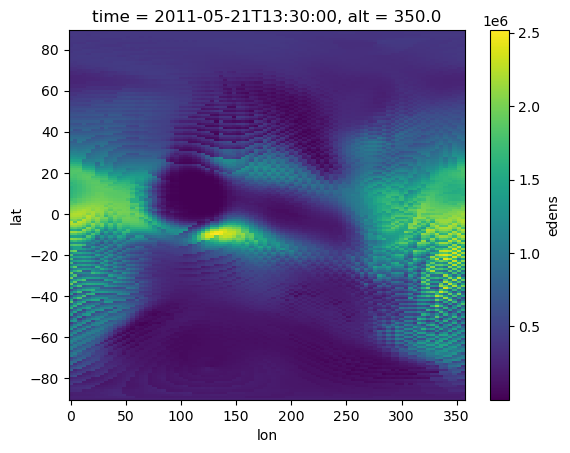

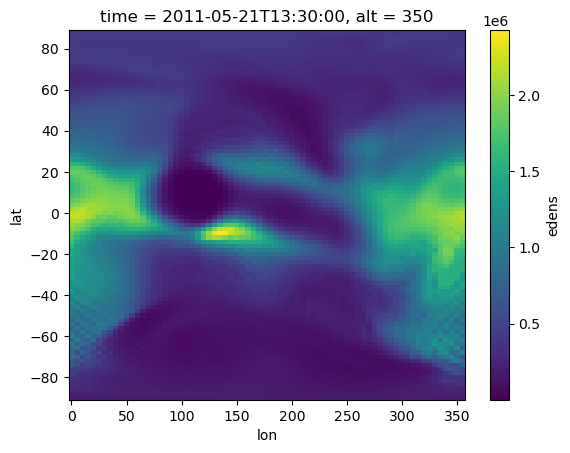

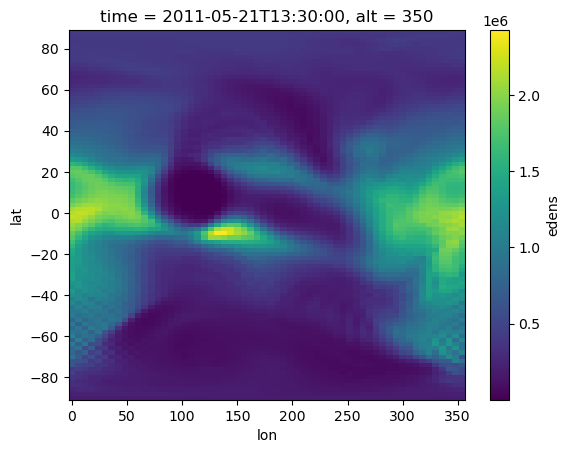

In [19]:
for d in dss:
    d.edens.sel(alt=350, time='2011-05-21 13:30', method='nearest').plot(x='lon')
    plt.show()

In [13]:
[i for i in os.listdir(simstorm_datadir) if 'L' in i]

['LND_interpolated2-new-cart_SAMI_REGRID.nc',
 'MONTH_AMP_ONSET_storm-DURATION_XARGS_MODEL-DTYPE',
 'SAMI_REGRID_LinearNDI-may-storm-on_.nc',
 'SAMI_REGRID_LND_interpolated2-new-cart_.nc']

In [31]:
samids.time[420]

<xarray.DataArray 'time' ()>
array('2011-05-21T11:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time     datetime64[ns] 2011-05-21T11:00:00

In [84]:
filds = filt_filt(samids.edens.integrate('alt'), percent=False)/1e7

In [92]:
for t in range(320, 500):
    fig = plt.figure()
    ax = fig.add_subplot(projection=ccrs.PlateCarree())
    filds.isel(time=t).plot(x='lon', vmin = -0.3, vmax=0.3, cmap='bwr', cbar_kwargs={'label':'DeltaTEC'}, transform = ccrs.PlateCarree(), ax=ax)
    ax.gridlines()
    ax.coastlines()
    plt.savefig('/glade/u/home/abukowski/plots/tmpplots/' + str(t))
    plt.close('all')

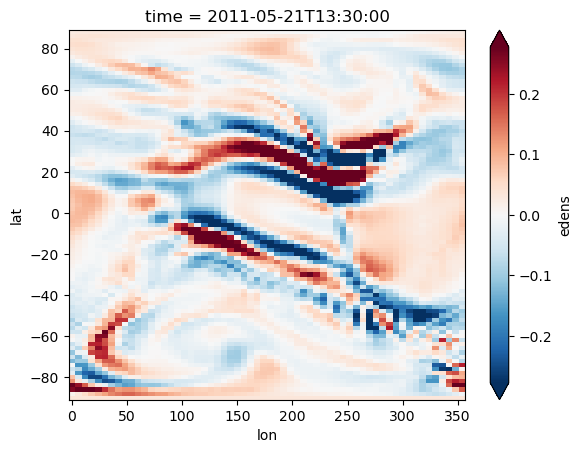

In [83]:
(filt_filt(samids.edens.integrate('alt'), percent=False)/1e7).sel(time='2011-05-21 13:30', method='nearest').plot(x='lon', robust=True)

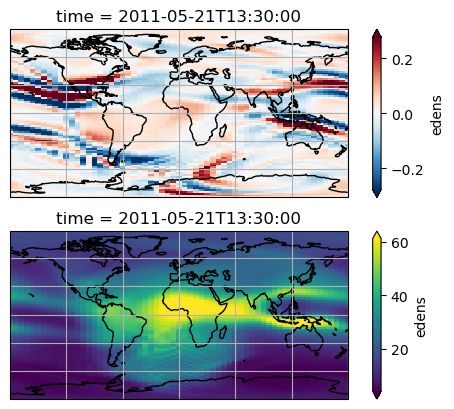

In [79]:
fig = plt.figure()
ax = fig.add_subplot(2,1,1,projection=ccrs.PlateCarree())
(filt_filt(samids.edens.integrate('alt'), percent=False)/1e7).sel(time='2011-05-21 13:30', method='nearest').plot(x='lon', transform = ccrs.PlateCarree(), robust=True, shading='nearest')
ax.gridlines()
ax.coastlines()

ax2 = fig.add_subplot(2,1,2,projection=ccrs.PlateCarree())
((samids.edens.integrate('alt'))/1e7).sel(time='2011-05-21 13:30', method='nearest').plot(x='lon', transform = ccrs.PlateCarree(), ax=ax2, robust=True)
ax2.gridlines()
ax2.coastlines()

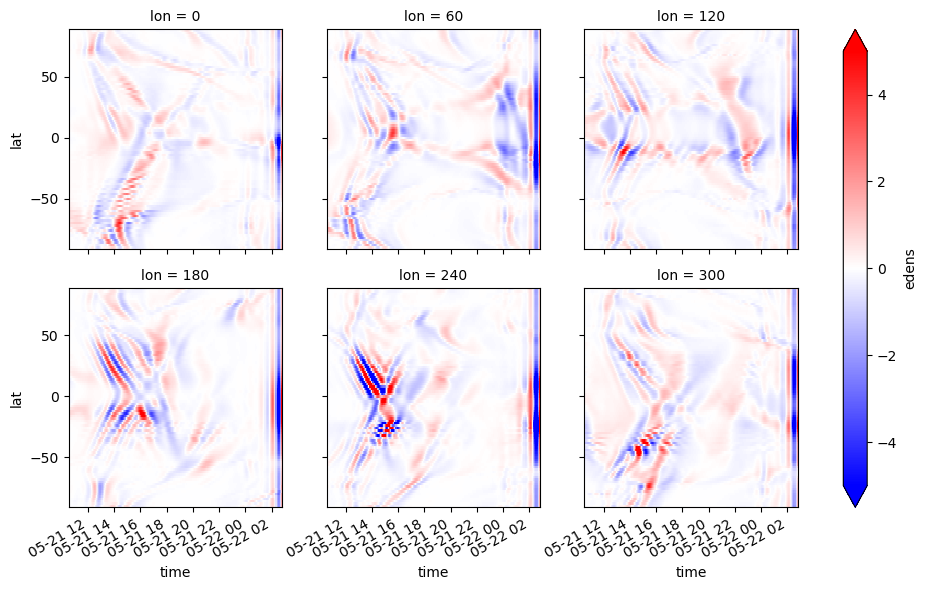

In [58]:
(filt_filt(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest'), lims=[45,85], order=1, percent=False)/1e6).isel(time=slice(415, -15)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

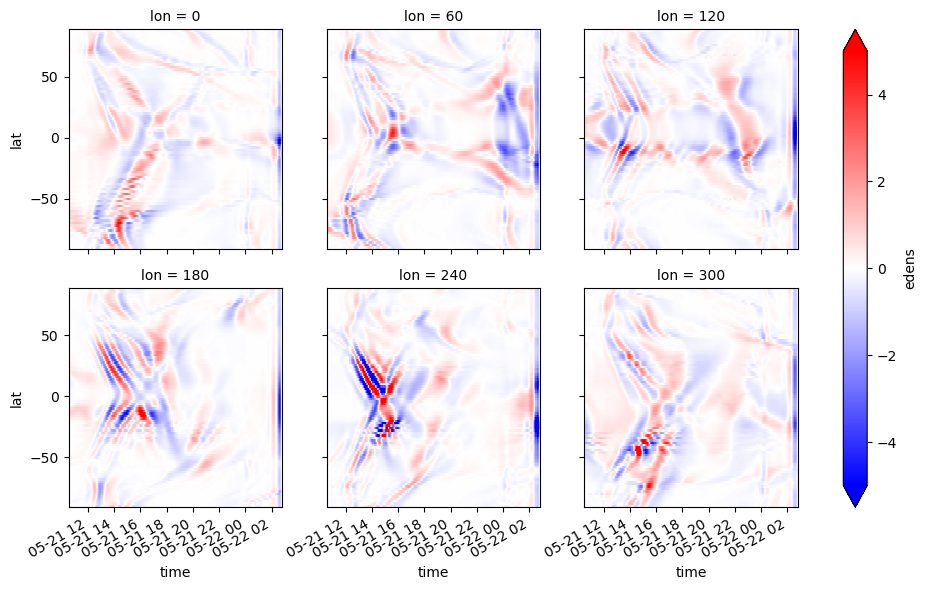

In [53]:
(filt_filt(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest'),percent=False)/1e6).isel(time=slice(415, -15)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

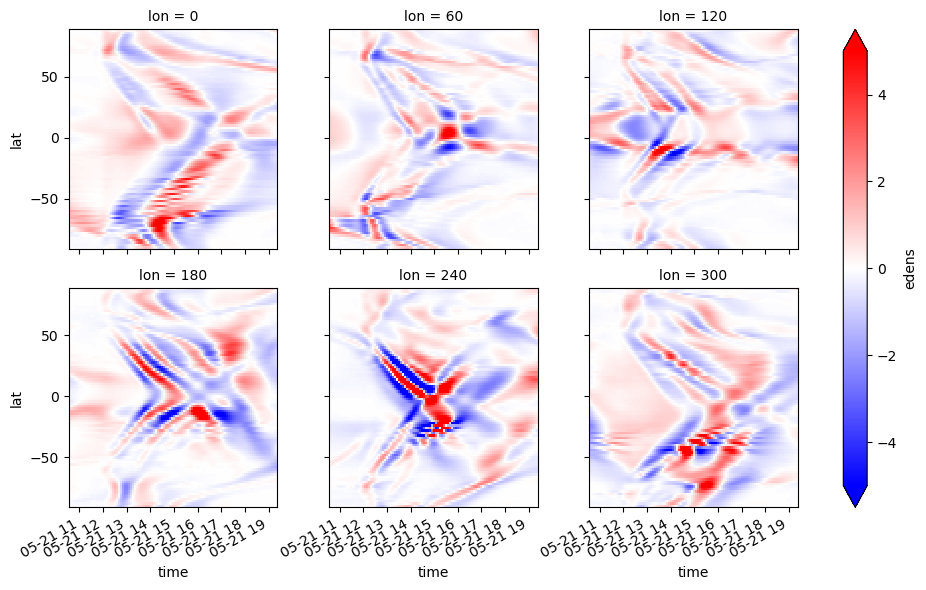

In [62]:
(filt_filt(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest'),percent=False, lims=[30,90], order=1)/1e6).isel(time=slice(415, 521)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

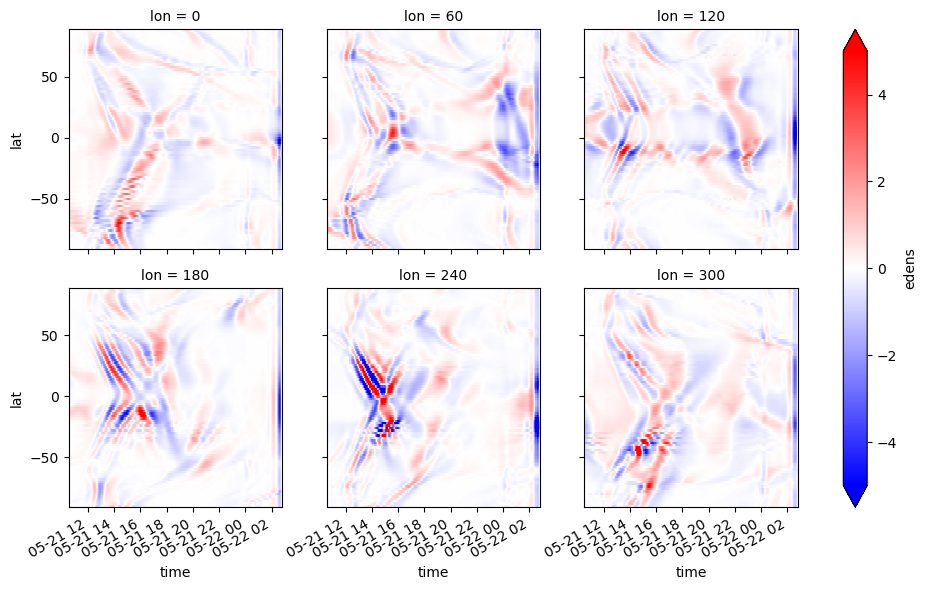

In [56]:
(filt_filt(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest'),percent=False, order=1)/1e6).isel(time=slice(415, -15)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

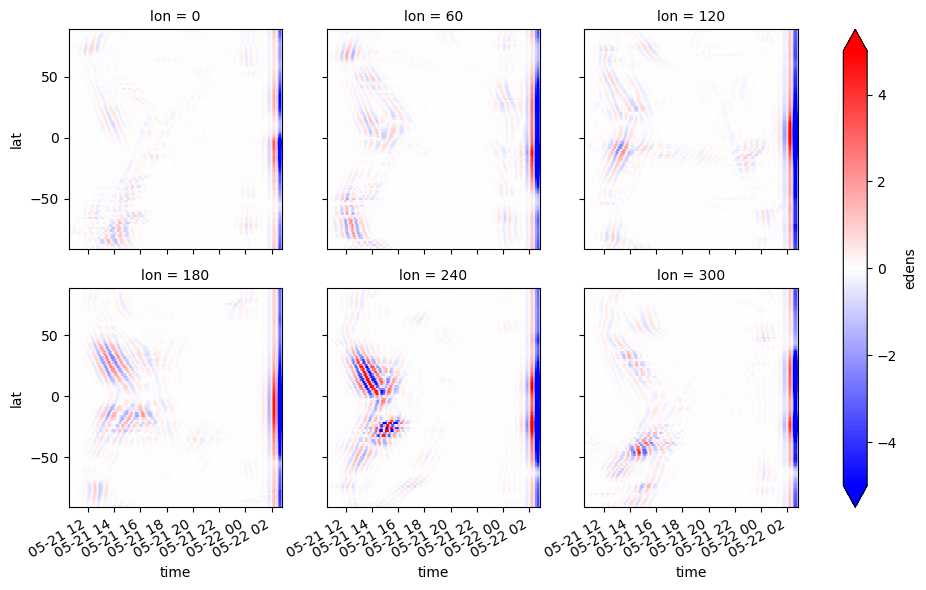

In [54]:
(filt_filt(filt_filt(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest'),percent=False), percent=False)/1e6).isel(time=slice(415, -15)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

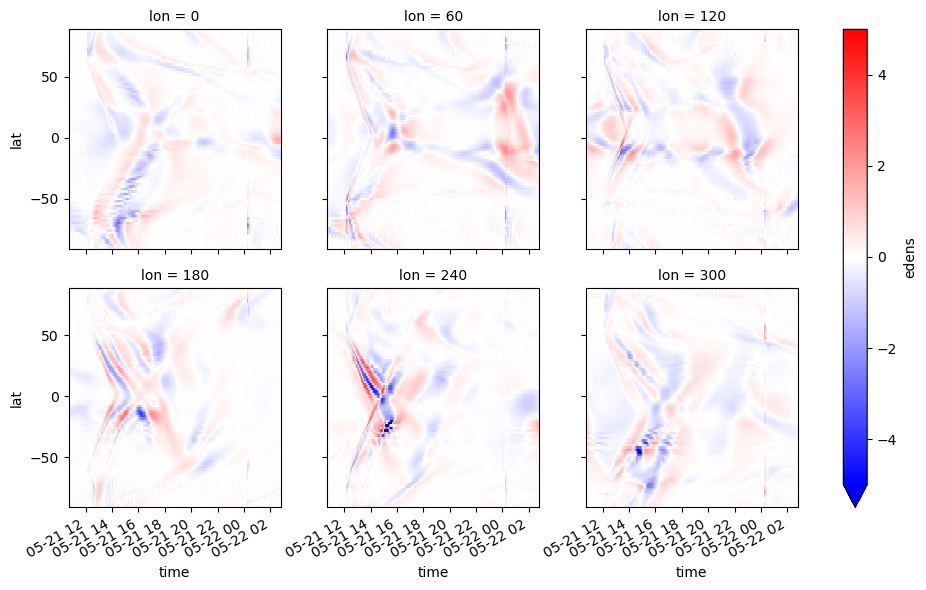

In [48]:
(samids.edens.integrate('alt').sel(lon=np.arange(0,360,60), method='nearest').diff('time', 2)/1e6).isel(time=slice(415, -15)).plot(col='lon', x='time', col_wrap=3, vmin=-5, vmax=5, cmap='bwr')

In [204]:
sample_freq = 5 # min

lowcut_f = 1 / (90 / (60/sample_freq))   # 85 minutes in units of sample^-1
highcut_f = 1 / (40 / (60/sample_freq))  # 30 minutes in units of sample^-1

# Define the Butterworth filter
nyquist = 0.5 * 5  # 5 minutes is the sampling frequency
low = lowcut_f / nyquist
high = highcut_f / nyquist
sos = butter(3, [low, high], btype="bandstop", output="sos")
# zi = sosfilt_zi(sos)

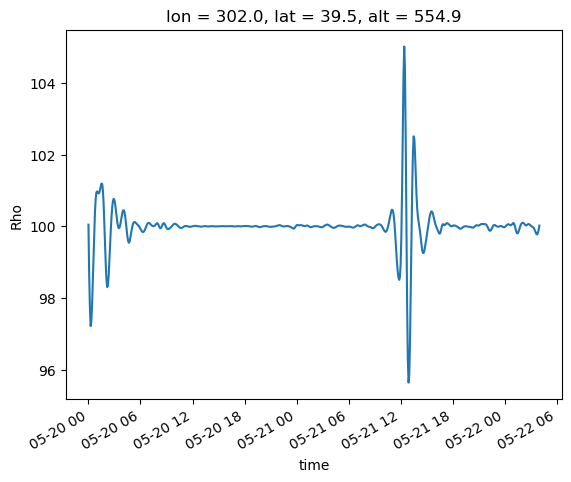

In [107]:
# Define sampling frequency and limits in minutes
sampling_freq = 5
lower_limit = 40
upper_limit = 90

# Convert limits to corresponding indices
lower_index = int(lower_limit / sampling_freq)
upper_index = int(upper_limit / sampling_freq)


# Design the bandpass filter
nyquist_freq = 0.5 * sampling_freq
lower_cutoff = lower_index / nyquist_freq
upper_cutoff = upper_index / nyquist_freq
b, a = butter(2, [1/upper_cutoff, 1/lower_cutoff], btype='band', analog=False)

# Apply the filter to the data
filtd = signal.filtfilt(b, a, dsa)
diff = (100*(dsa-filtd)/dsa)
diff.plot()

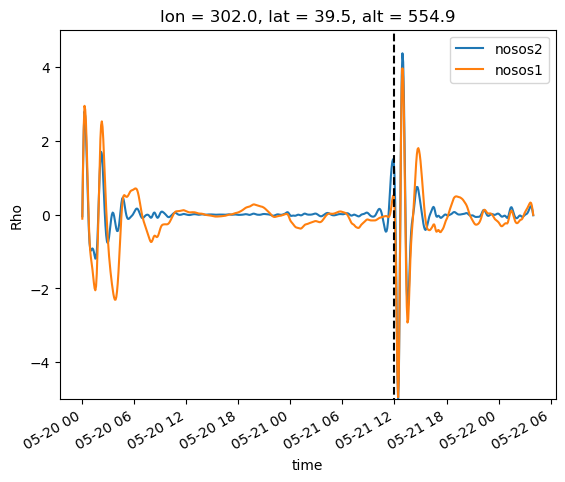

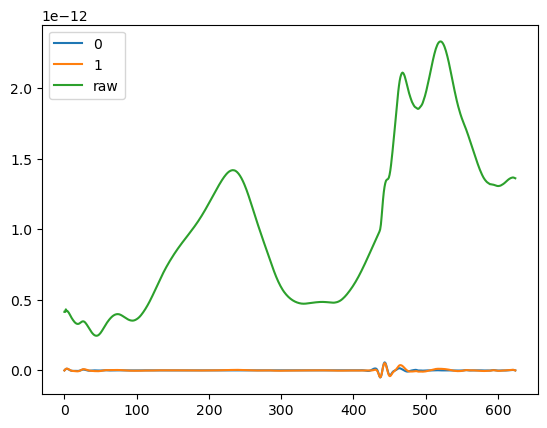

In [185]:
atlat = 40
atlon = 300


filts = []



# sos = butter(2, [low, high], btype="bandstop", output="sos")
# dsa = gitmds[v].sel(alt=at_alt, lat=atlat,lon=atlon, method='nearest')

# filtd = sosfiltfilt(sos, dsa, axis=0)
        
# ds = (100*(dsa-filtd)/dsa)

# filts.append(filtd)

# ds.plot(label='filtfilt2')

# sos = butter(1, [low, high], btype="bandstop", output="sos")
# dsa = gitmds[v].sel(alt=at_alt, lat=atlat,lon=atlon, method='nearest')

# filtd = sosfiltfilt(sos, dsa, axis=0)
        
# ds = (100*(dsa-filtd)/dsa)

# filts.append(filtd)

# ds.plot(label='filtfilt1')


# dsa = gitmds[v].sel(alt=at_alt, lat=atlat,lon=atlon, method='nearest')

# filtd = sosfilt(sos, dsa, axis=0)
        
# ds = (100*(dsa-filtd)/dsa)
# filts.append(filtd)
# ds.plot(label='filt')

# dsa = gitmds[v].sel(alt=at_alt, lat=atlat,lon=atlon, method='nearest')
# b,a = butter(2, [low, high], btype="bandstop")
# filtd = lfilter(b,a, dsa, axis=0)
        
# ds = (100*(dsa-filtd)/dsa)
# filts.append(filtd)
# ds.plot(label='lfilt')





# Define sampling frequency and limits in minutes
sampling_freq = 5
lower_limit = 40
upper_limit = 120

# Convert limits to corresponding indices
lower_index = int(lower_limit / sampling_freq)
upper_index = int(upper_limit / sampling_freq)


# Design the bandpass filter
nyquist_freq = 0.5 * sampling_freq
lower_cutoff = lower_index / nyquist_freq
upper_cutoff = upper_index / nyquist_freq
b, a = butter(1, [1/upper_cutoff, 1/lower_cutoff], btype='band', analog=False)

# Apply the filter to the data
filtd = signal.filtfilt(b, a, dsa)
ds = (100*(filtd)/dsa)
ds.plot(label='nosos1')
filts.append(filtd)




# # Define sampling frequency and limits in minutes
# sampling_freq = 5
# lower_limit = 40
# upper_limit = 120

# # Convert limits to corresponding indices
# lower_index = int(lower_limit / sampling_freq)
# upper_index = int(upper_limit / sampling_freq)


# # Design the bandpass filter
# nyquist_freq = 0.5 * sampling_freq
# lower_cutoff = lower_index / nyquist_freq
# upper_cutoff = upper_index / nyquist_freq
# b, a = butter(2, [1/upper_cutoff, 1/lower_cutoff], btype='band', analog=False)

# # Apply the filter to the data
# fgust = signal.filtfilt(b, a, dsa, padtype="even")
# ds = (100*(fgust)/dsa)
# ds.plot(label='even')
# filts.append(fgust)

# fpad = signal.filtfilt(b, a, dsa, padlen=15)
# ds = (100*(fpad)/dsa)
# ds.plot(label='pad5')
# filts.append(fpad)


plt.vlines(pd.Timestamp('2011-05-21 12:00'), -25, 25, color = 'k', linestyles='--')

plt.ylim(-5, 5)
plt.legend()
plt.show()




for num, ln in enumerate(filts):
    plt.plot(ln, label=str(num))
plt.plot(dsa, label = 'raw')
plt.legend()
# plt.vlines(pd.Timestamp('2011-05-21 12:00'), -25, 25, color = 'k', linestyles='--')


plt.show()


# brk

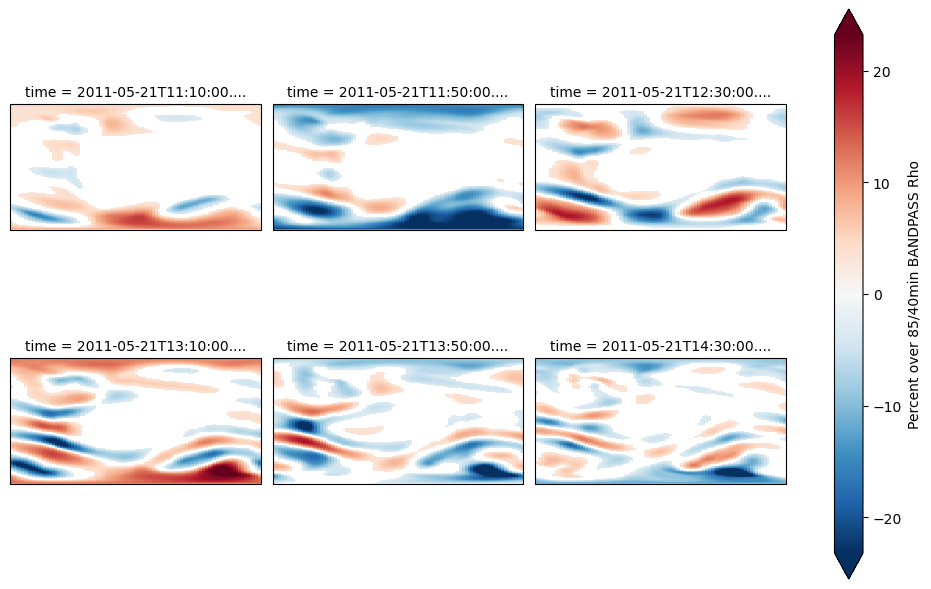

In [324]:
ts = [storm_start - pd.Timedelta('01:30:00') +
      pd.Timedelta('0:40:00')*i for i in range(1, 7)]

tvals = [np.argmin(np.abs(gitmds.time.values - i.to_numpy())) for i in ts]

dsa = gitmds[v].sel(alt=500,method='nearest')
filtd = sosfiltfilt(sos, dsa, axis=0)
        
datas = (100*(dsa-filtd)/dsa).sel(time=ts, method='nearest')


datas.where(np.abs(datas) > 3).plot(
    x='lon', robust=True, col='time', col_wrap=3,
    cbar_kwargs={'label': 'Percent over 85/40min BANDPASS %s' % v},
    transform=ccrs.PlateCarree(),
    subplot_kws={
    'projection': ccrs.PlateCarree()},)

plt.show()

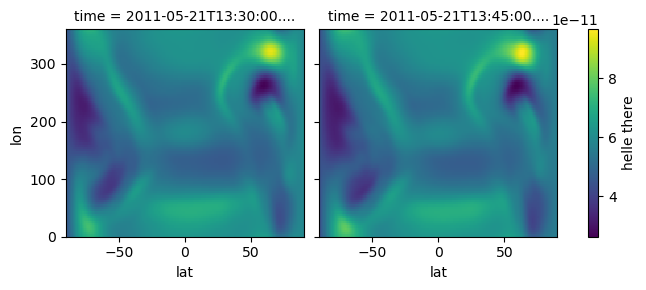

In [349]:
a = gitmds.Rho.isel(time=[450,453], alt=25).plot(col='time', add_colorbar=False)
a.add_colorbar(label='helle there')
plt.show()


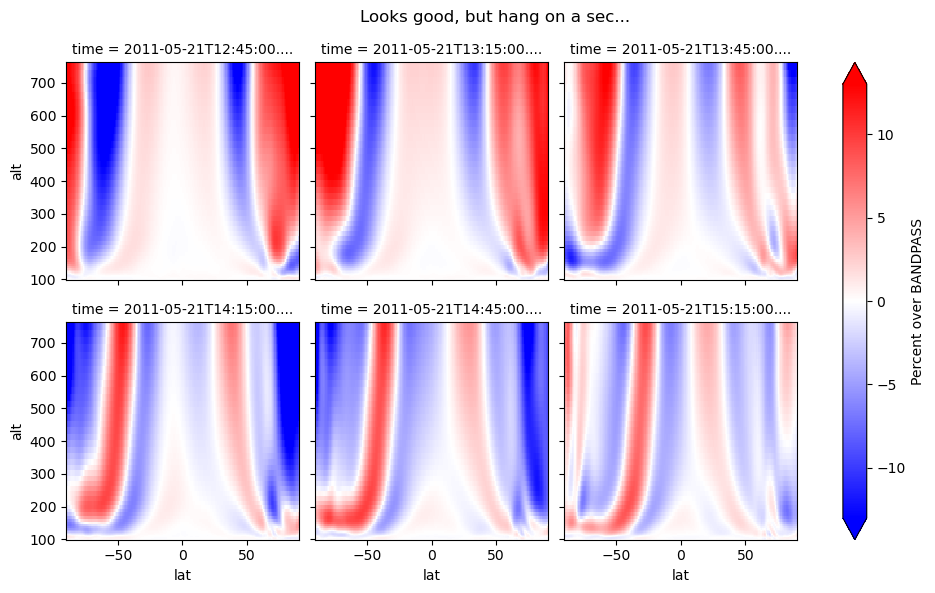

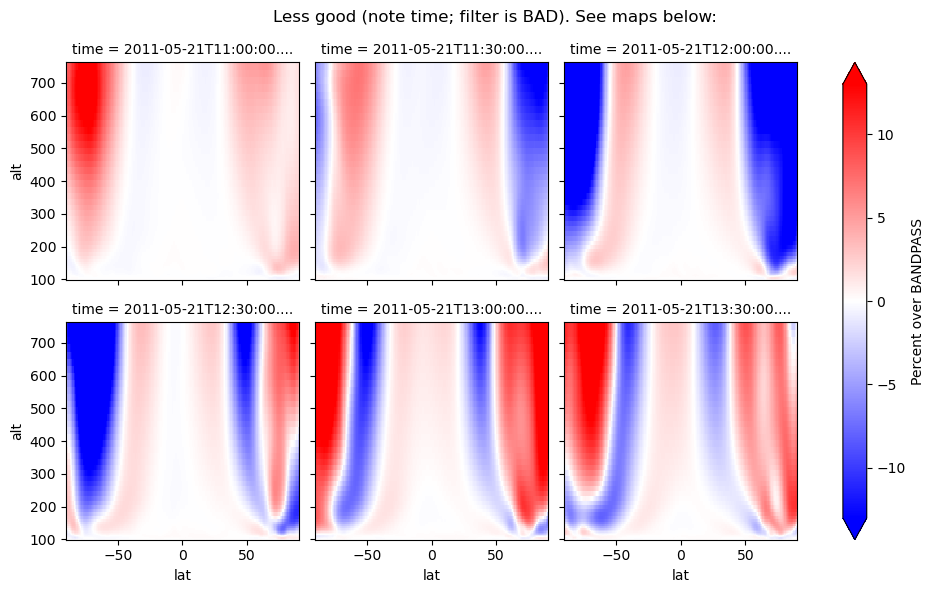

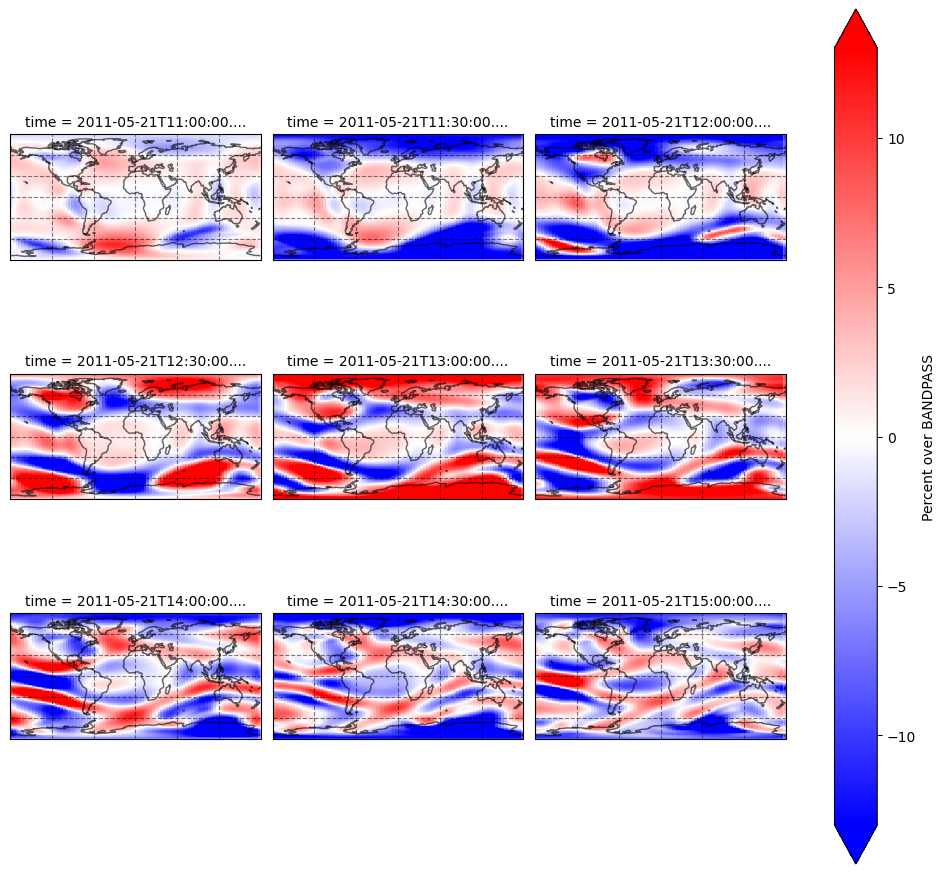

In [369]:

sosds = sos_filt_filt(gitmds['Rho'].sel(lon=500,method='nearest'), order=2, lims=[100,30])

times = [storm_start + pd.Timedelta('00:15:00') +
      pd.Timedelta('0:30:00')*i for i in range(1, 7)]
plotting_routines.panel_plot(sosds,
                             x='lat',
                             y='alt',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             plot_vals=times,
                             cbar_label='Percent over BANDPASS',
                             suptitle='Looks good, but hang on a sec...',
                             tight_layout=True,
                             vlims=13)
plt.show()
times = [storm_start - pd.Timedelta('01:30:00') +
      pd.Timedelta('0:30:00')*i for i in range(1, 7)]
plotting_routines.panel_plot(sosds,
                             x='lat',
                             y='alt',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             cbar_label='Percent over BANDPASS',
                             suptitle='Less good (note time; filter is BAD). See maps below:',
                             vlims=13)
plt.show()

times = [storm_start - pd.Timedelta('01:30:00') +
      pd.Timedelta('0:30:00')*i for i in range(1, 10)]
sosds = sos_filt_filt(gitmds['Rho'].sel(alt=500,method='nearest'), order=2, lims=[120,40])
plotting_routines.panel_plot(sosds,
                             x='lon',
                             y='lat',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             do_map=True,
                             cbar_label='Percent over BANDPASS',
                             vlims=13)

## New filter!!

In [19]:
gitmds['Rho'].sel(lon=300, method='nearest').values.shape

(625, 180, 50)

In [10]:
times = [storm_start - pd.Timedelta('01:30:00') +
      pd.Timedelta('0:30:00')*i for i in range(1, 10)]

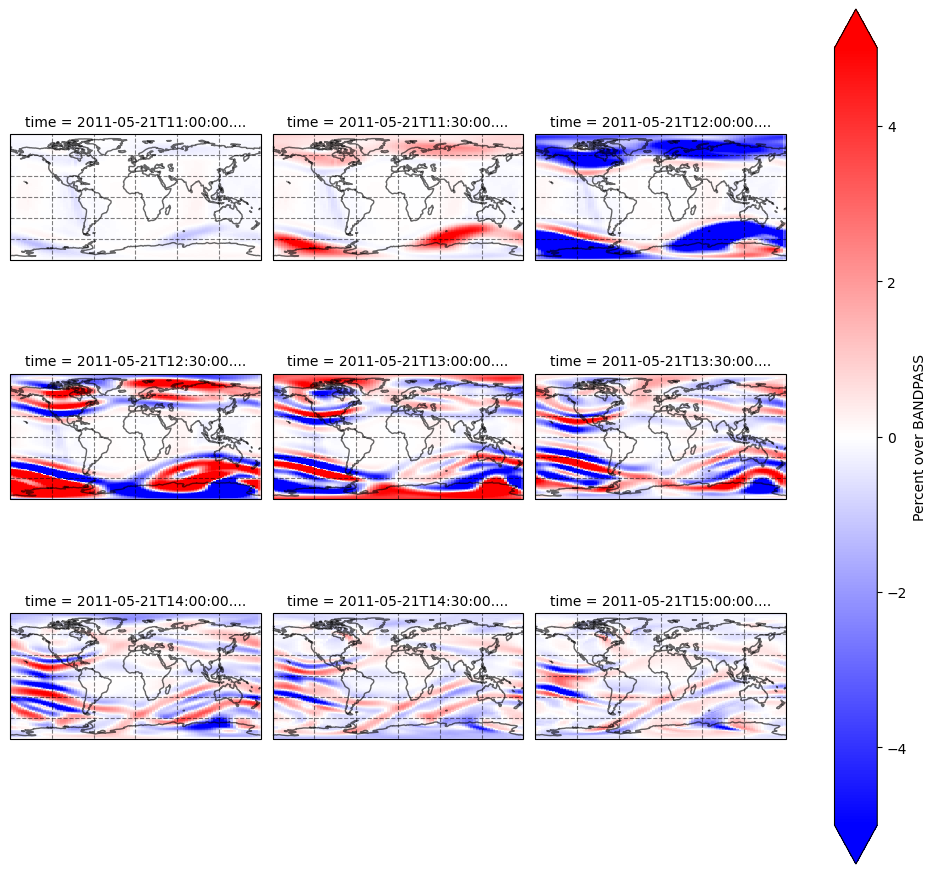

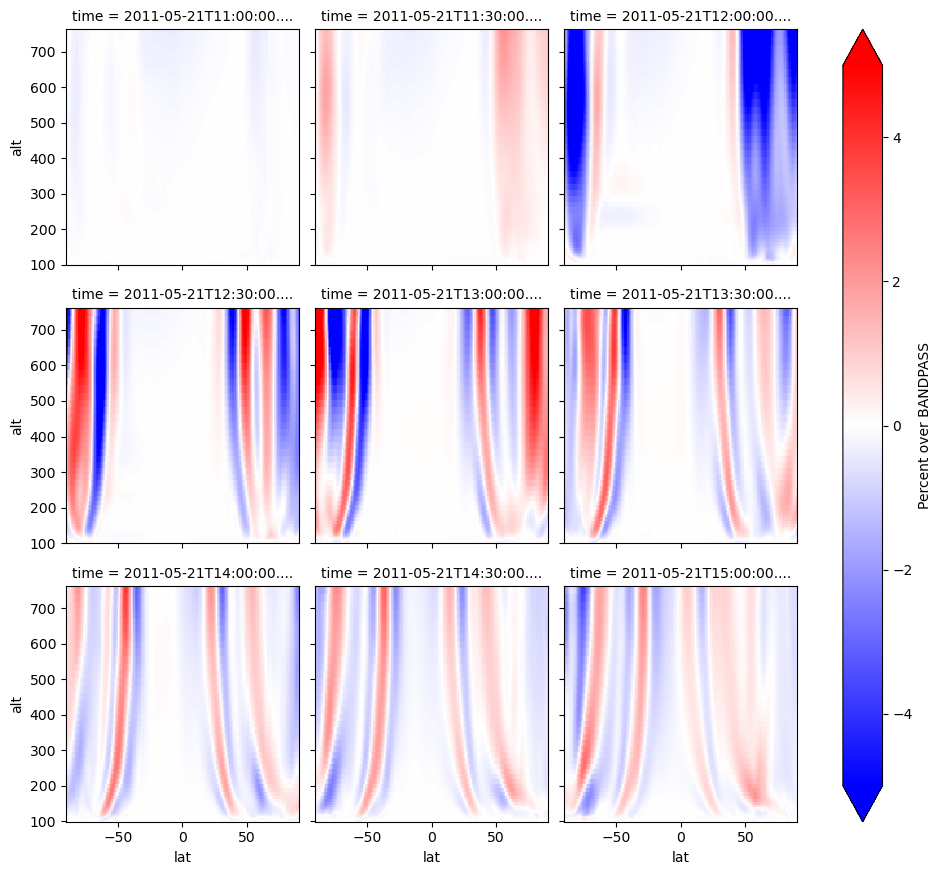

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


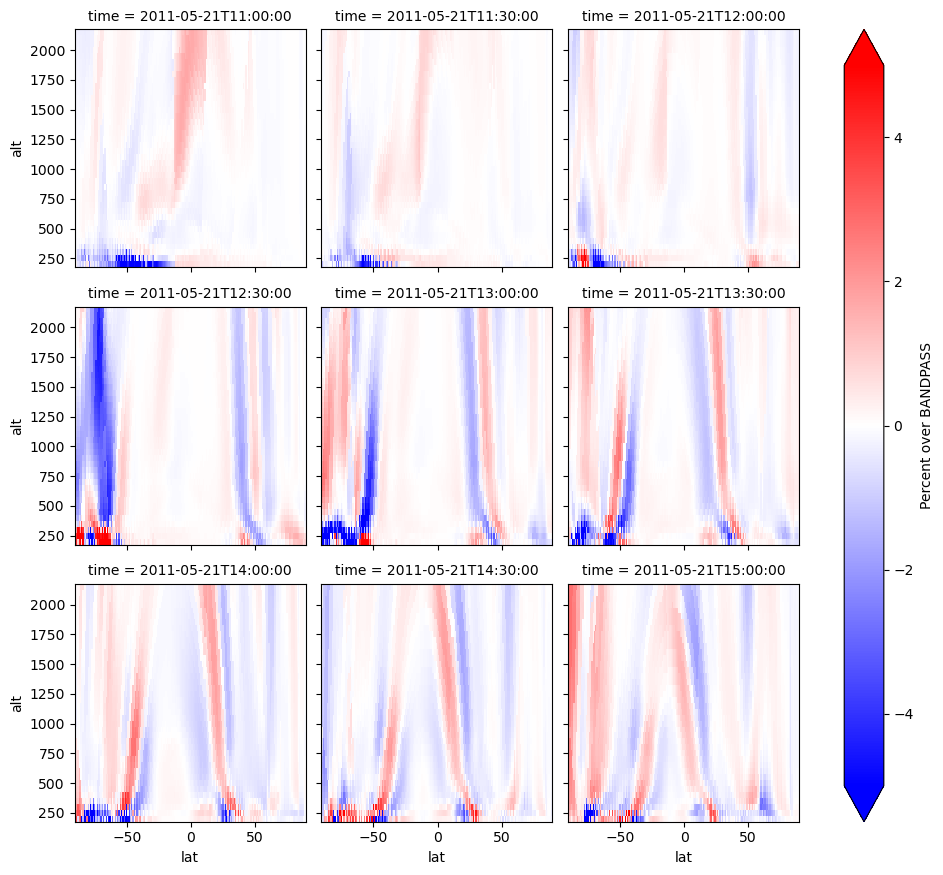

In [27]:
times = [storm_start - pd.Timedelta('01:30:00') +
      pd.Timedelta('0:30:00')*i for i in range(1, 10)]


sosds = filt_filt(gitmds['Rho'].sel(alt=500,method='nearest'), order=1, lims=[90,40])

plotting_routines.panel_plot(sosds,
                             x='lon',
                             y='lat',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             do_map=True,
                             cbar_label='Percent over BANDPASS',
                             vlims=5)
plt.show()


sosds = filt_filt(gitmds['Rho'].sel(lon=300,method='nearest'), order=1, lims=[90,40])

plotting_routines.panel_plot(sosds,
                             x='lat',
                             y='alt',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             cbar_label='Percent over BANDPASS',
                             # suptitle='Less good (note time; filter is BAD). See maps below:',
                             vlims=5)
plt.show()

sosds = filt_filt(samids['edens'].sel(lon=300,method='nearest'), order=1, lims=[90,40])

plotting_routines.panel_plot(sosds,
                             x='lat',
                             y='alt',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             cbar_label='Percent over BANDPASS',
                             # suptitle='Less good (note time; filter is BAD). See maps below:',
                             vlims=5)
plt.show()

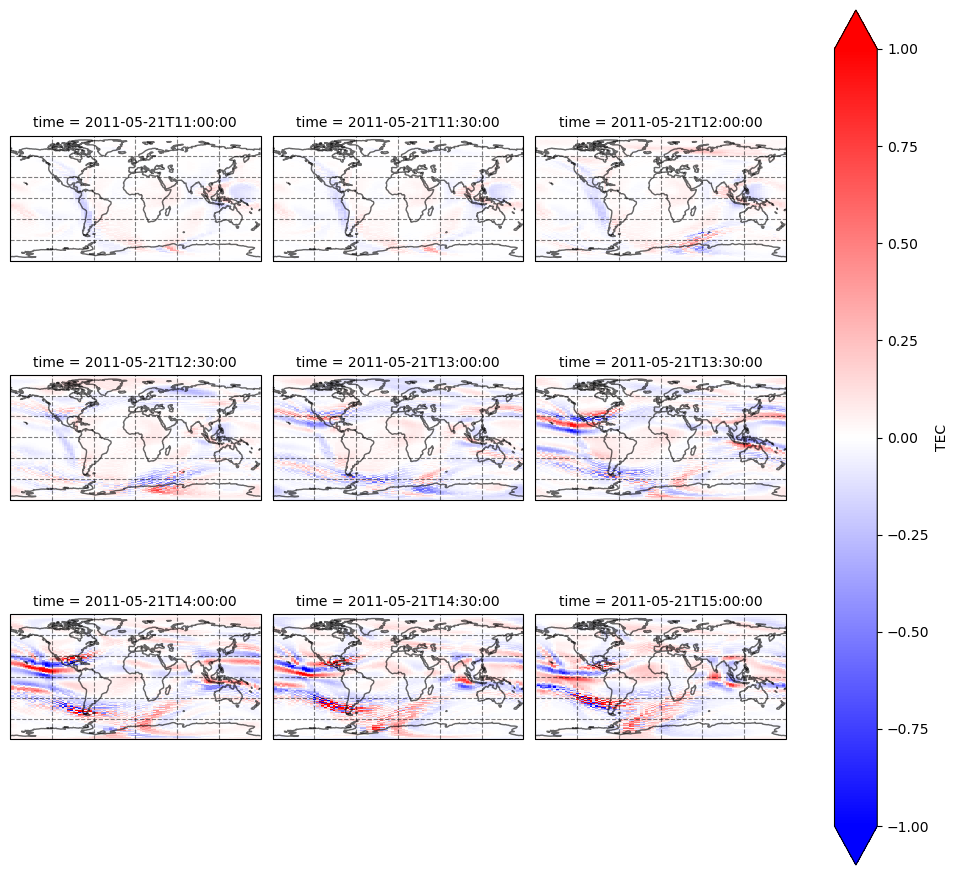

In [29]:
sosds = filt_filt(samids['edens'].integrate('alt'), order=1, lims=[90,40], percent=False)/1e7

plotting_routines.panel_plot(sosds,
                             x='lon',
                             y='lat',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             do_map=True,
                             cbar_label='TEC',
                             vlims=1)
plt.show()

In [8]:
eden = xr.open_mfdataset('/glade/u/home/abukowski/SAMI_REGRID.nc', engine='h5netcdf')

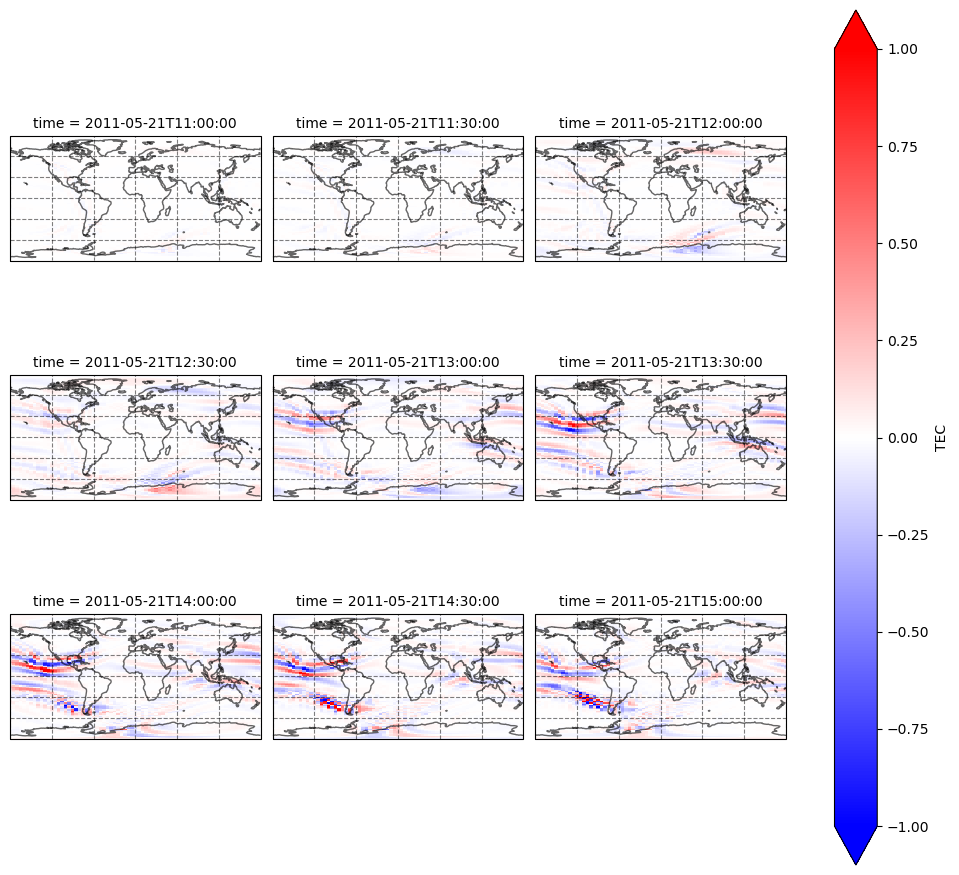

In [12]:
sosds = filt_filt(eden['edens'].integrate('alt'), order=2, lims=[90,40], percent=False)/1e7

plotting_routines.panel_plot(sosds,
                             x='lon',
                             y='lat',
                             wrap_col='time',
                             col_wrap=3,
                             isel_plotvals=False,
                             tight_layout=True,
                             plot_vals=times,
                             do_map=True,
                             cbar_label='TEC',
                             vlims=1)
plt.show()

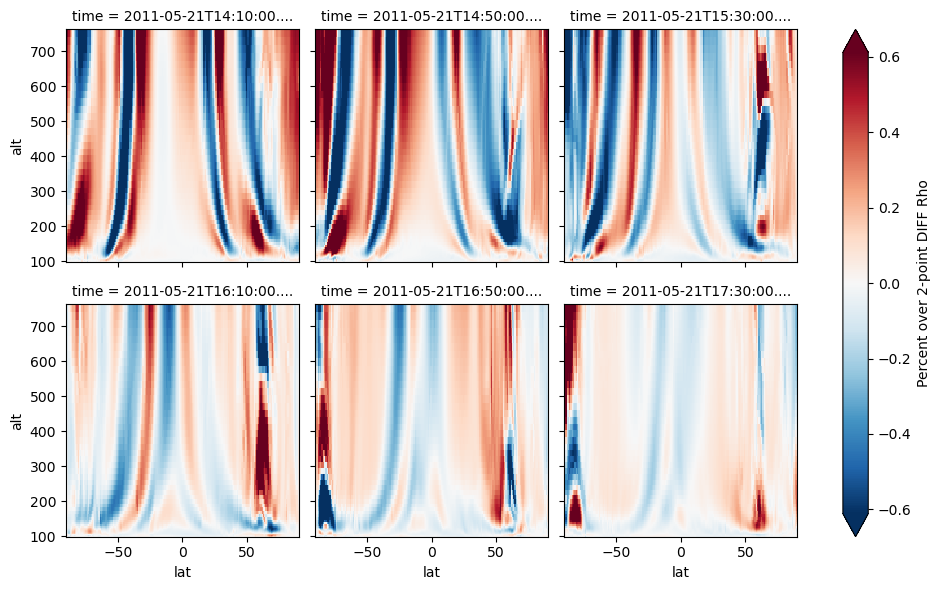

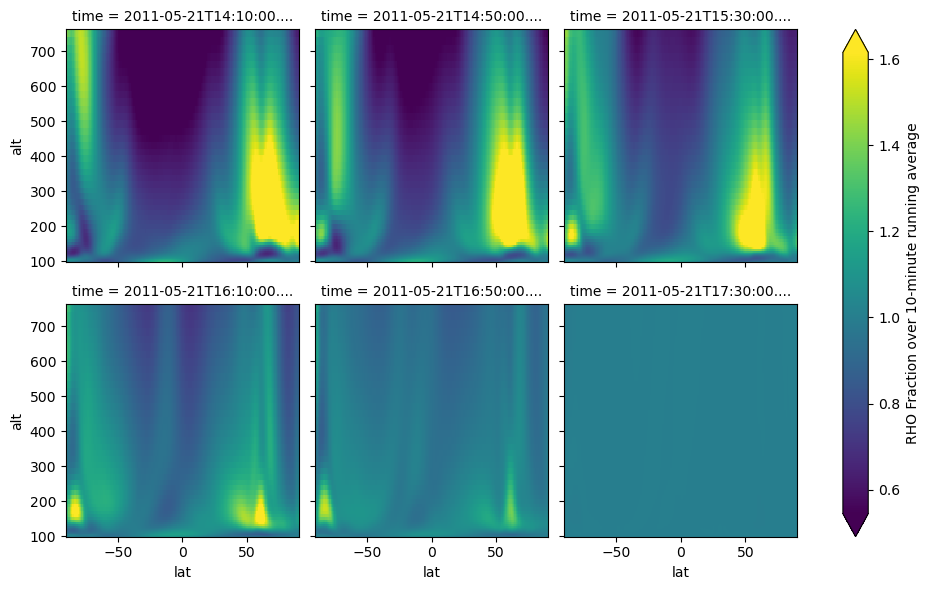

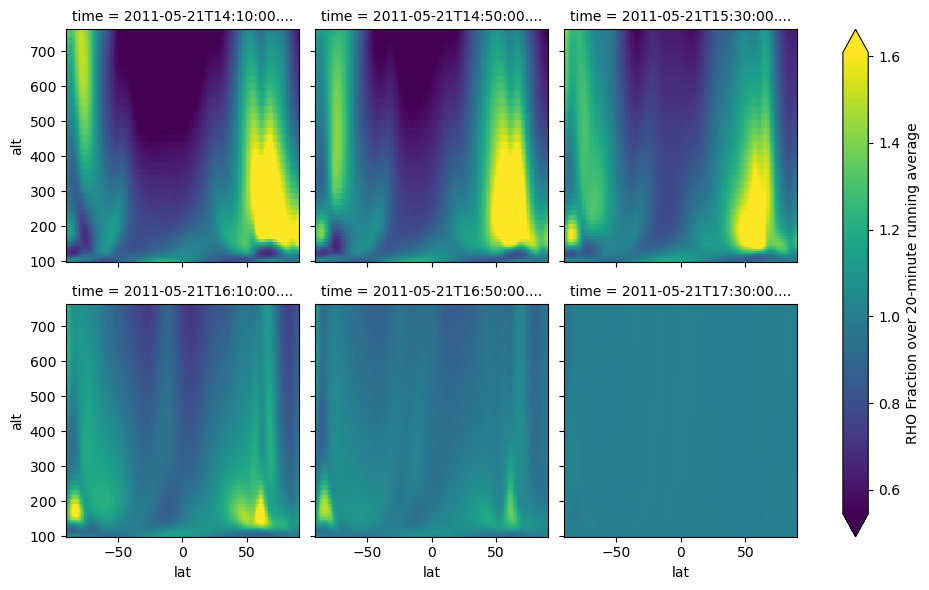

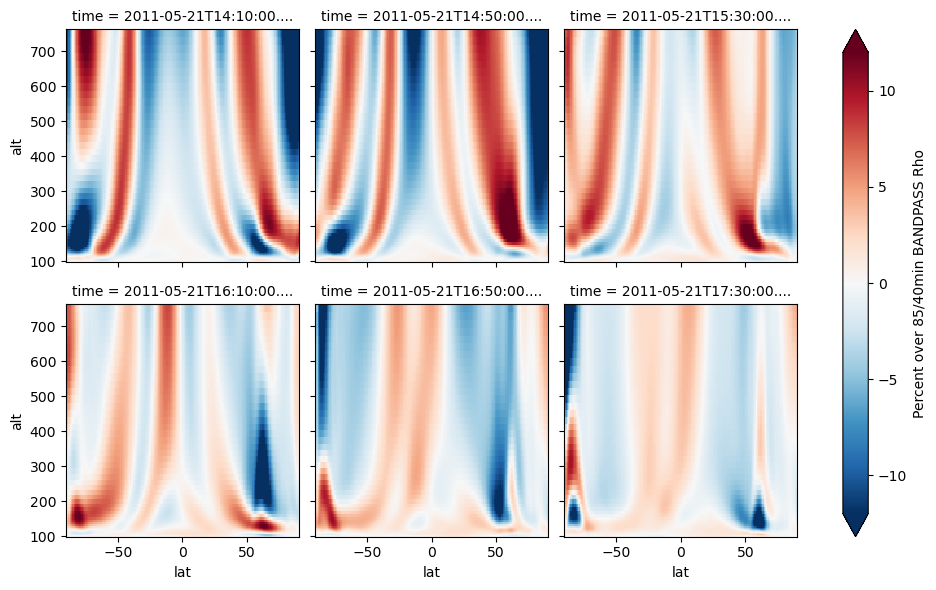

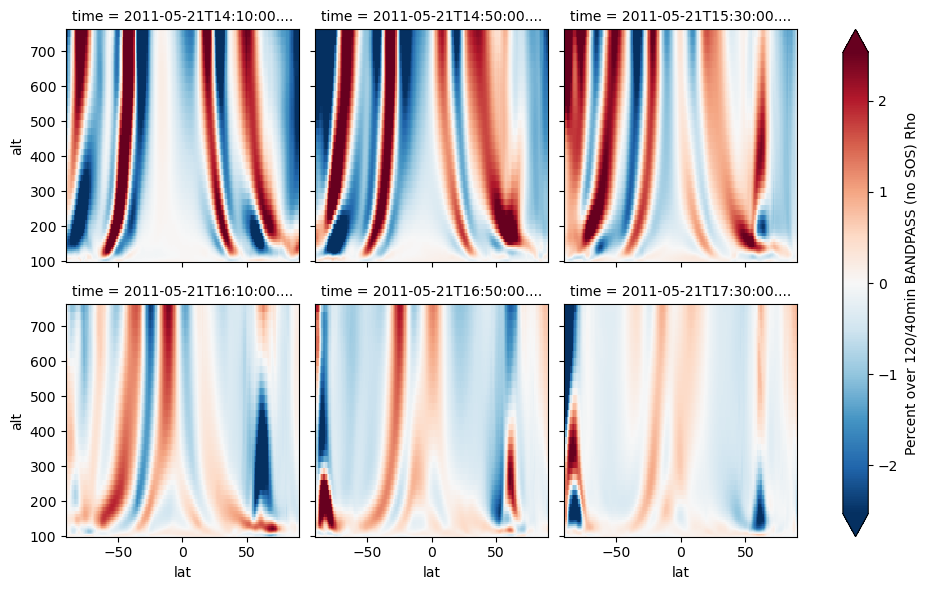

In [186]:

ts = [storm_start + pd.Timedelta('01:30:00') +
      pd.Timedelta('0:40:00')*i for i in range(1, 7)]

tvals = [np.argmin(np.abs(gitmds.time.values - i.to_numpy())) for i in ts]


for v in gitmds.data_vars:
    if 'alt' in gitmds[v].coords:
        
        dsa = gitmds[v].sel(lon=300,method='nearest')
        
        cents = filters.filter_xarray_DA_diff(
            dsa, percent=True)
        cents.sel(time=ts, method='nearest').plot(x='lat', robust=True, col='time', col_wrap=3,
                                                  cbar_kwargs={'label': 'Percent over 2-point DIFF %s' % v})

        plt.show()

        dst = xr.Dataset()

        for t in tvals:
            dst = dsa.isel(time=slice(t-2, t+3)).mean('time')
        (dsa.sel(time=ts, method='nearest')/dst).plot(x='lat', col='time', col_wrap=3,
                                                      cbar_kwargs={'label': '%s Fraction over 10-minute running average' % v.upper(), },
                                                      robust=True)

        plt.show()

        dst = xr.Dataset()

        for t in tvals:
            dst = dsa.isel(
                time=slice(t-4, t+5)).mean('time')
        (dsa.sel(time=ts, method='nearest')/dst).plot(x='lat', col='time', col_wrap=3,
                                                      cbar_kwargs={'label': '%s Fraction over 20-minute running average' % v.upper(), },
                                                      robust=True)

        plt.show()
        

        filtd = sosfiltfilt(sos, dsa, axis=0)
        
        (100*(dsa-filtd)/dsa).sel(time=ts, method='nearest').plot(
            x='lat', robust=True, col='time', col_wrap=3, cbar_kwargs={'label': 'Percent over 85/40min BANDPASS %s' % v})

        plt.show()
        
        
        # Define sampling frequency and limits in minutes
        sampling_freq = 5
        lower_limit = 40
        upper_limit = 120

        # Convert limits to corresponding indices
        lower_index = int(lower_limit / sampling_freq)
        upper_index = int(upper_limit / sampling_freq)


        # Design the bandpass filter
        nyquist_freq = 0.5 * sampling_freq
        lower_cutoff = lower_index / nyquist_freq
        upper_cutoff = upper_index / nyquist_freq
        b, a = butter(1, [1/upper_cutoff, 1/lower_cutoff], btype='band', analog=False)

        # Apply the filter to the data
        filtd = signal.filtfilt(b, a, dsa, axis=0)
        (100*(filtd)/dsa).sel(time=ts, method='nearest').plot(
            x='lat', robust=True, col='time', col_wrap=3, cbar_kwargs={'label': 'Percent over 120/40min BANDPASS (no SOS) %s' % v})
        
        
        break

In [135]:
for t in range(10):
    print(t, t%3)

0 0
1 1
2 2
3 0
4 1
5 2
6 0
7 1
8 2
9 0


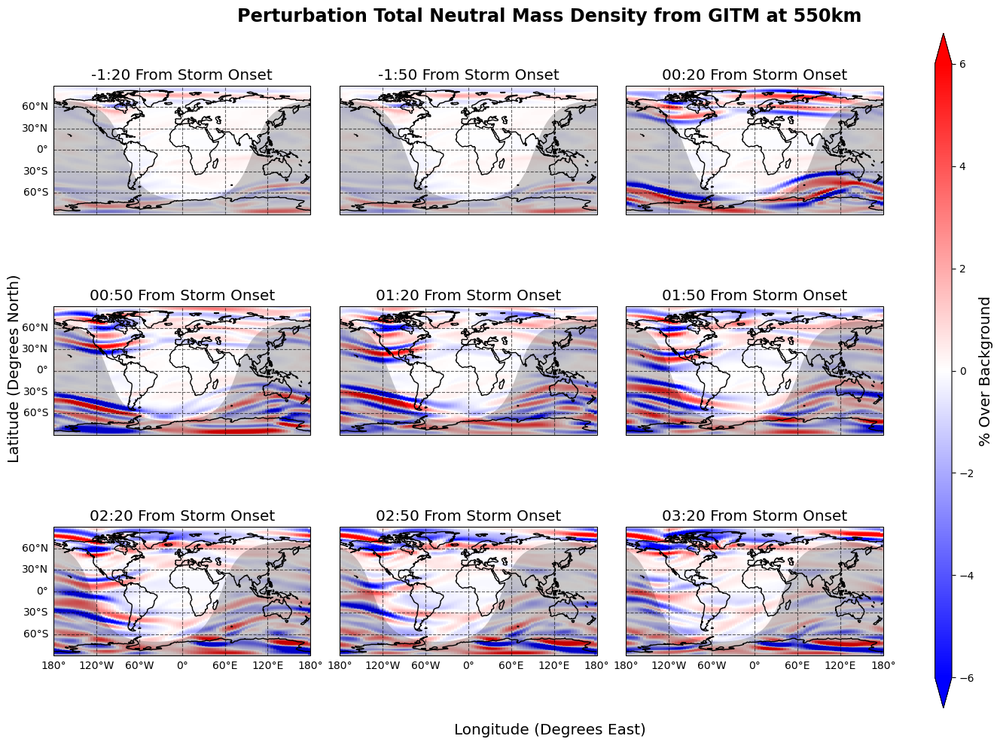

In [226]:
storm_start = pd.Timestamp(2011, 5, 21, 12)
plot_start = pd.Timestamp(2011, 5, 21, 11, 20)
plot_delta = pd.Timedelta('30 minutes')

numplots = 9


col = 'Rho'
at_alt = 550


dsa = gitmds[v].sel(alt=at_alt, method='nearest')


# Define sampling frequency and limits in minutes
sampling_freq = 5
lower_limit = 40
upper_limit = 120

# Convert limits to corresponding indices
lower_index = int(lower_limit / sampling_freq)
upper_index = int(upper_limit / sampling_freq)


# Design the bandpass filter
nyquist_freq = 0.5 * sampling_freq
lower_cutoff = lower_index / nyquist_freq
upper_cutoff = upper_index / nyquist_freq
b, a = butter(1, [1/upper_cutoff, 1/lower_cutoff], btype='band', analog=False)

# Apply the filter to the data
filtd = signal.filtfilt(b, a, dsa)
ds = (100*(filtd)/dsa)

vlims = 6


plt.close('all')

fig, axs = plt.subplots(3, 3, figsize=(15, 10), subplot_kw={
    'projection': ccrs.PlateCarree()},
                       sharex=True,
                       sharey=True,)

# plotting...
# Setup some things...
tnow = plot_start
t = 0


axes = axs.flatten()

while tnow < plot_start + plot_delta * numplots:
    im = ds.sel(time=tnow, method='nearest').plot(x='lon', transform=ccrs.PlateCarree(),
                                             vmin=-vlims,
                                             vmax=vlims,
                                             ax=axes[t],
                                             add_colorbar=False,
                                             cmap='bwr'
                                             )

    
    axes[t].set_title("%s From Storm Onset"%timedeltatotime(tnow-storm_start), fontsize='x-large')
    axes[t].coastlines(zorder=3, color='black', alpha=1)
    lines = axes[t].gridlines(color='black', linestyle='--',
                            alpha=0.6, )
    lines.bottom_labels = True if t >= numplots-3 else False
    lines.left_labels = True if t%3==0 else False
    
    axes[t].add_feature(Nightshade(tnow, alpha = 0.21))    
    tnow += plot_delta
    t += 1
    
    

    



fig.supxlabel('Longitude (Degrees East)', fontsize='x-large')
fig.supylabel('Latitude (Degrees North)', fontsize='x-large')
        
fig.suptitle("Perturbation Total Neutral Mass Density from GITM at %ikm" %at_alt,
            fontsize='xx-large', fontweight='heavy')

fig.tight_layout()

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="vertical",
             aspect=40, extend='both',)
cbar.set_label('% Over Background', fontsize='x-large')

fig.show()


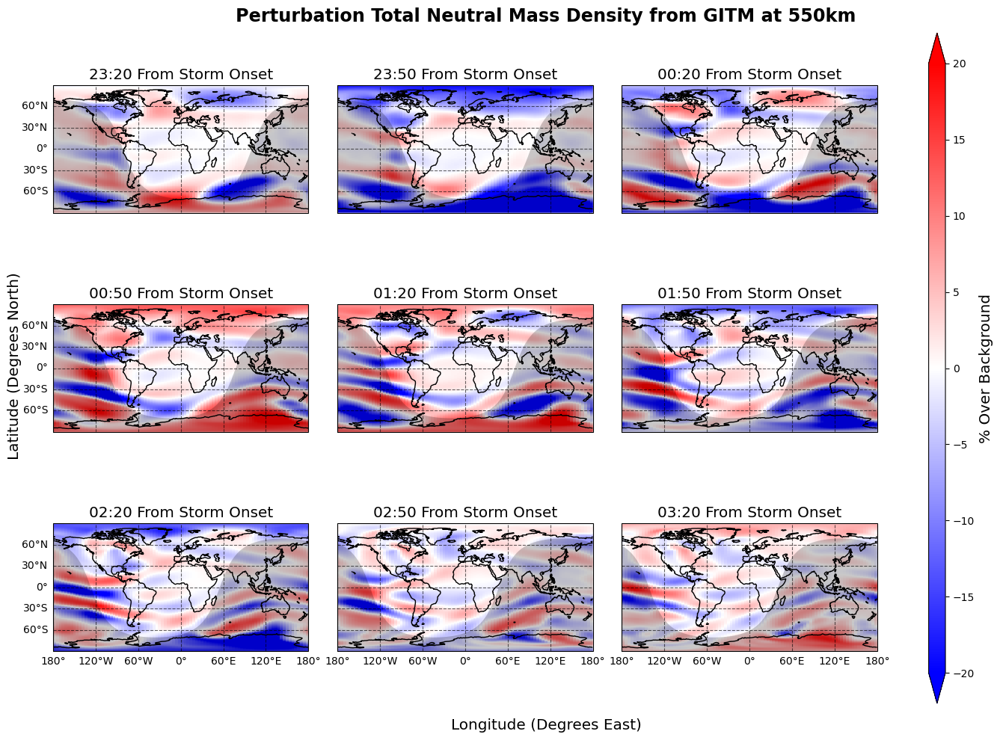

In [205]:
storm_start = pd.Timestamp(2011, 5, 21, 12)
plot_start = pd.Timestamp(2011, 5, 21, 11, 20)
plot_delta = pd.Timedelta('30 minutes')

numplots = 9


col = 'Rho'
at_alt = 550


dsa = gitmds[v].sel(alt=at_alt, method='nearest')


filtd = sosfiltfilt(sos, dsa, axis=0)
ds = (100*(dsa-filtd)/dsa)

vlims = 20


plt.close('all')

fig, axs = plt.subplots(3, 3, figsize=(15, 10), subplot_kw={
    'projection': ccrs.PlateCarree()},
                       sharex=True,
                       sharey=True,)

# plotting...
# Setup some things...
tnow = plot_start
t = 0


axes = axs.flatten()

while tnow < plot_start + plot_delta * numplots:
    im = ds.sel(time=tnow, method='nearest').plot(x='lon', transform=ccrs.PlateCarree(),
                                             vmin=-vlims,
                                             vmax=vlims,
                                             ax=axes[t],
                                             add_colorbar=False,
                                             cmap='bwr'
                                             )

    
    axes[t].set_title("%s From Storm Onset"%timedeltatotime(tnow-storm_start), fontsize='x-large')
    axes[t].coastlines(zorder=3, color='black', alpha=1)
    lines = axes[t].gridlines(color='black', linestyle='--',
                            alpha=0.6, )
    lines.bottom_labels = True if t >= numplots-3 else False
    lines.left_labels = True if t%3==0 else False
    
    axes[t].add_feature(Nightshade(tnow, alpha = 0.21))    
    tnow += plot_delta
    t += 1
    
    

    



fig.supxlabel('Longitude (Degrees East)', fontsize='x-large')
fig.supylabel('Latitude (Degrees North)', fontsize='x-large')

fig.align_xlabels(axs.ravel().tolist())
        
fig.suptitle("Perturbation Total Neutral Mass Density from GITM at %ikm" %at_alt,
            fontsize='xx-large', fontweight='heavy')

fig.tight_layout()

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="vertical",
             aspect=40, extend='both',)
cbar.set_label('% Over Background', fontsize='x-large')

fig.show()


-1 20 0
-1 50 0
0 20 0
0 50 0
1 20 0
1 50 0
2 20 0
2 50 0
3 20 0


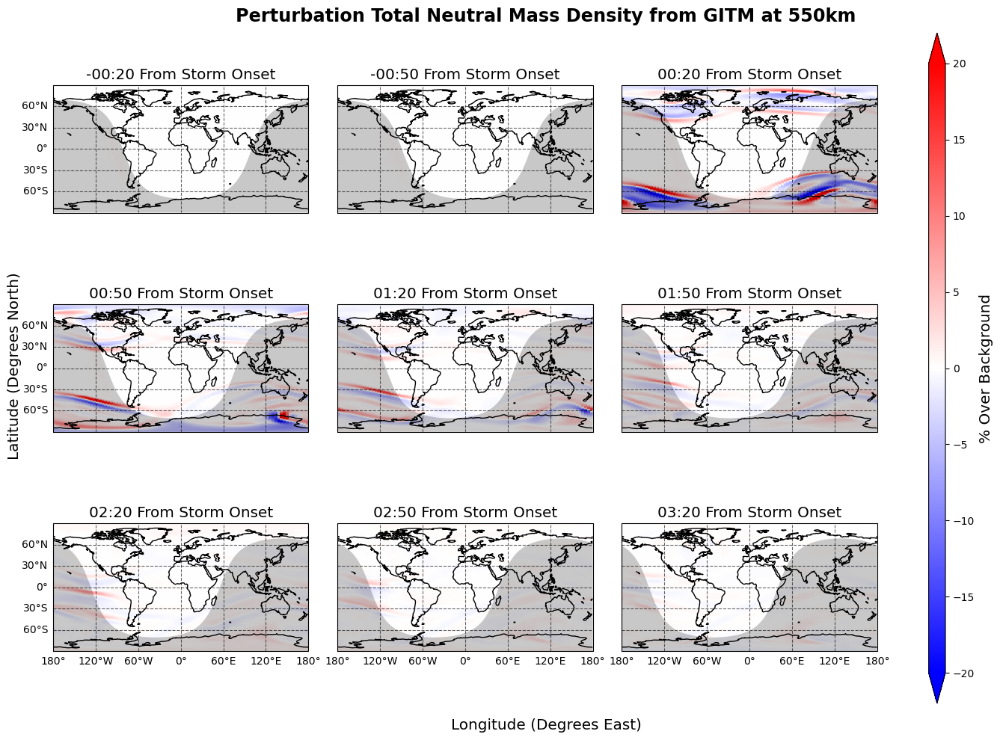

In [282]:
storm_start = pd.Timestamp(2011, 5, 21, 12)
plot_start = pd.Timestamp(2011, 5, 21, 11, 20)
plot_delta = pd.Timedelta('30 minutes')

numplots = 9


col = 'Rho'
at_alt = 550


dsa = gitmds[v].sel(alt=at_alt, method='nearest')


ds = filters.filter_xarray_DA_diff(dsa, percent=True)

vlims = 20


plt.close('all')

fig, axs = plt.subplots(3, 3, figsize=(15, 10), subplot_kw={
    'projection': ccrs.PlateCarree()},
                       sharex=True,
                       sharey=True,)

# plotting...
# Setup some things...
tnow = plot_start
t = 0


axes = axs.flatten()

while tnow < plot_start + plot_delta * numplots:
    im = ds.sel(time=tnow, method='nearest').plot(x='lon', transform=ccrs.PlateCarree(),
                                             vmin=-vlims,
                                             vmax=vlims,
                                             ax=axes[t],
                                             add_colorbar=False,
                                             cmap='bwr'
                                             )

    
    axes[t].set_title("%s From Storm Onset"%timedeltatotime(tnow-storm_start), fontsize='x-large')
    axes[t].coastlines(zorder=3, color='black', alpha=1)
    lines = axes[t].gridlines(color='black', linestyle='--',
                            alpha=0.6, )
    lines.bottom_labels = True if t >= numplots-3 else False
    lines.left_labels = True if t%3==0 else False
    
    axes[t].add_feature(Nightshade(tnow, alpha = 0.21))    
    tnow += plot_delta
    t += 1
    
    

    



fig.supxlabel('Longitude (Degrees East)', fontsize='x-large')
fig.supylabel('Latitude (Degrees North)', fontsize='x-large')

fig.align_xlabels(axs.ravel().tolist())
        
fig.suptitle("Perturbation Total Neutral Mass Density from GITM at %ikm" %at_alt,
            fontsize='xx-large', fontweight='heavy')

fig.tight_layout()

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), orientation="vertical",
             aspect=40, extend='both',)
cbar.set_label('% Over Background', fontsize='x-large')

fig.show()


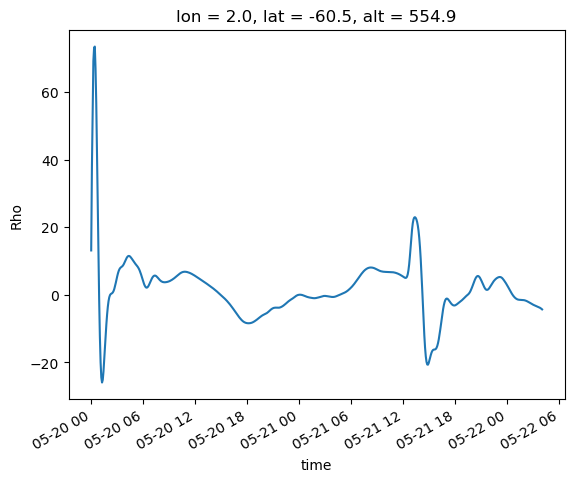

In [43]:
dsa = gitmds[v].sel(alt=at_alt, method='nearest')

filtd = sosfilt(sos, dsa, axis=0)
        
ds = (100*(dsa-filtd)/dsa)

ds.sel(lat=-60,lon=0, method='nearest').plot()

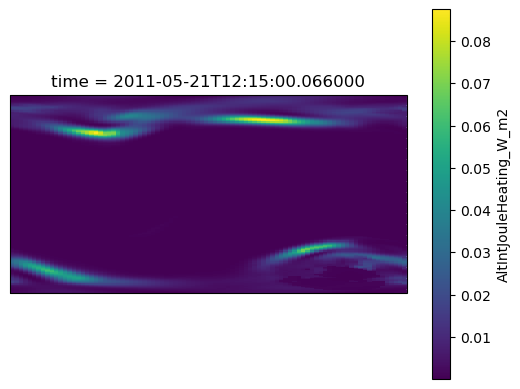

In [29]:
gitmds.AltIntJouleHeating_W_m2.sel(time='2011-5-21 12:15', method='nearest').plot(x='lon', subplot_kws={'projection':ccrs.PlateCarree()}, transform=ccrs.PlateCarree())

In [13]:
l = [i for i in "Rho O_3P O2 N2 N_4S NO He N_2D N_2P H CO2 O_1D Temperature Vn_east Vn_north Vn_up".split(' ')]

In [14]:
l

['Rho',
 'O_3P',
 'O2',
 'N2',
 'N_4S',
 'NO',
 'He',
 'N_2D',
 'N_2P',
 'H',
 'CO2',
 'O_1D',
 'Temperature',
 'Vn_east',
 'Vn_north',
 'Vn_up']

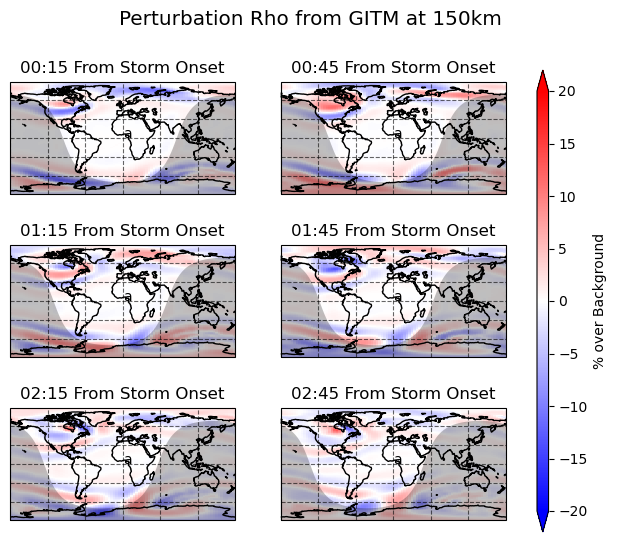

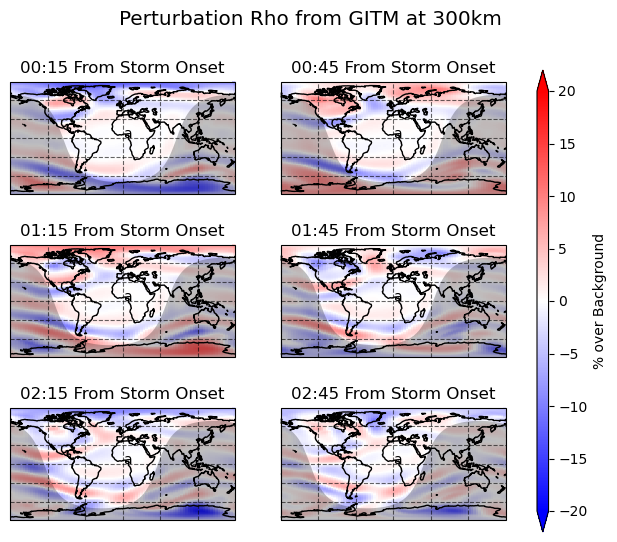

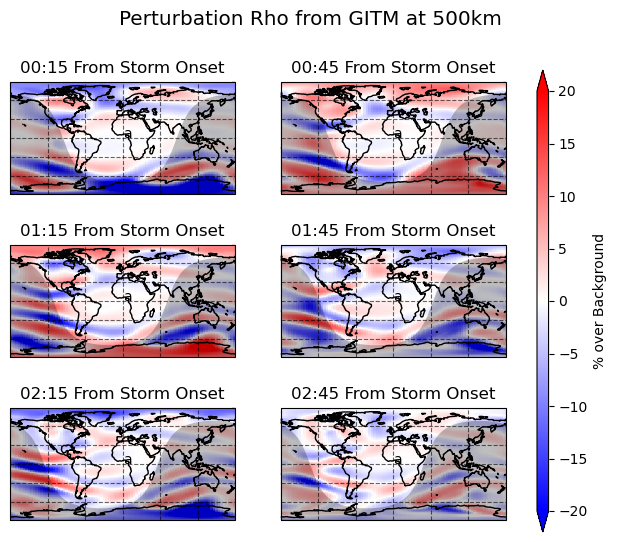

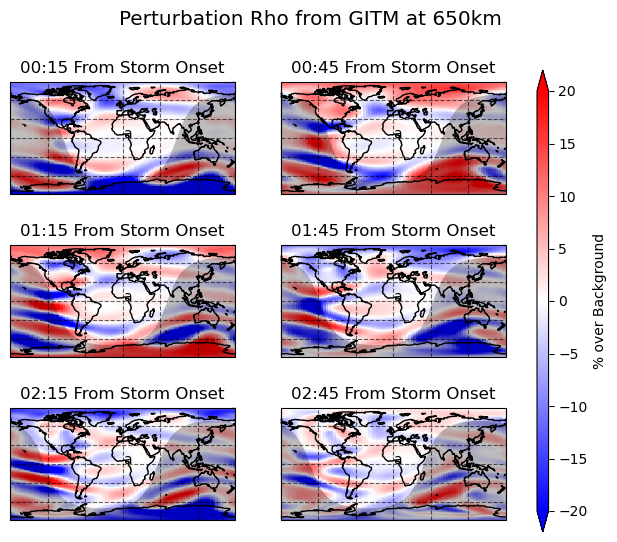

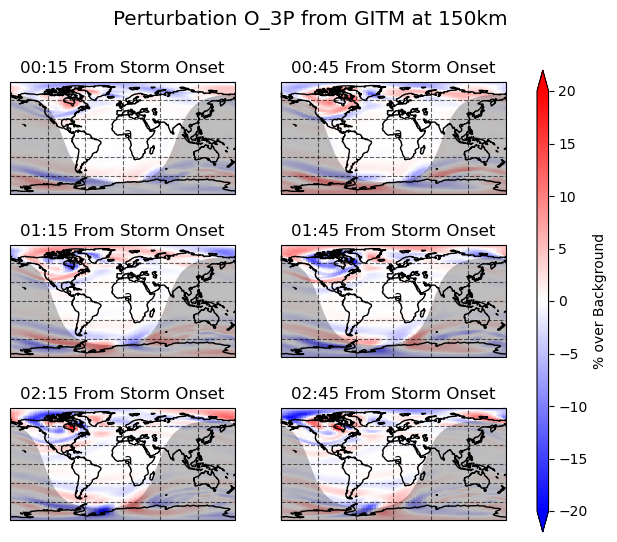

...

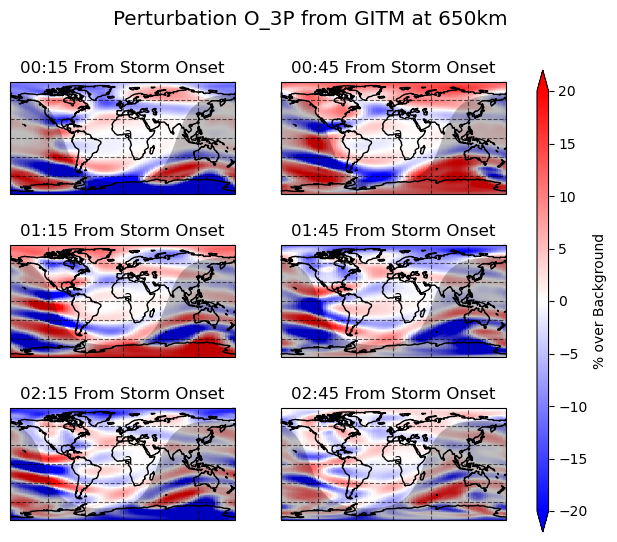

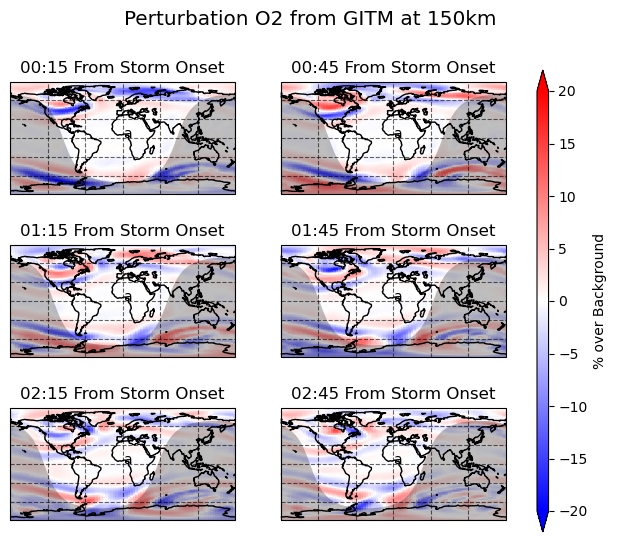

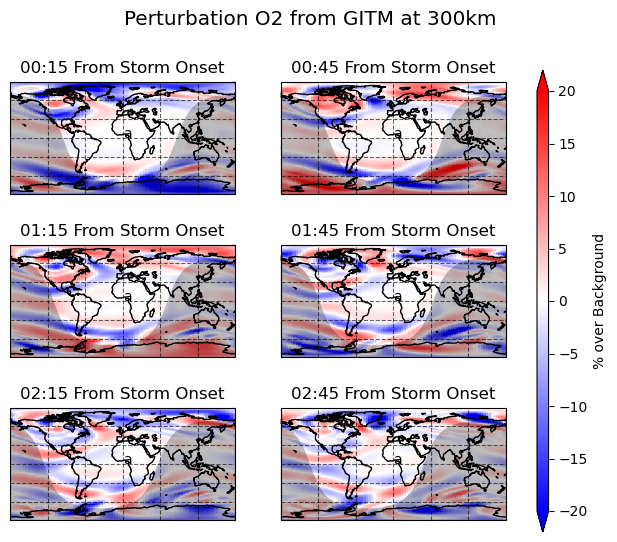

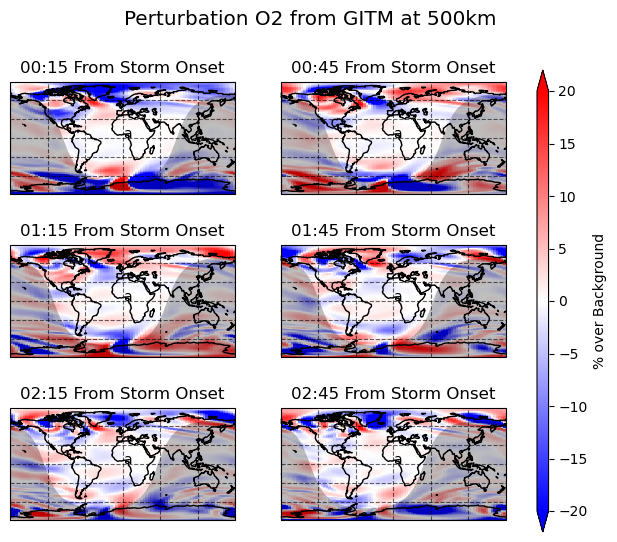

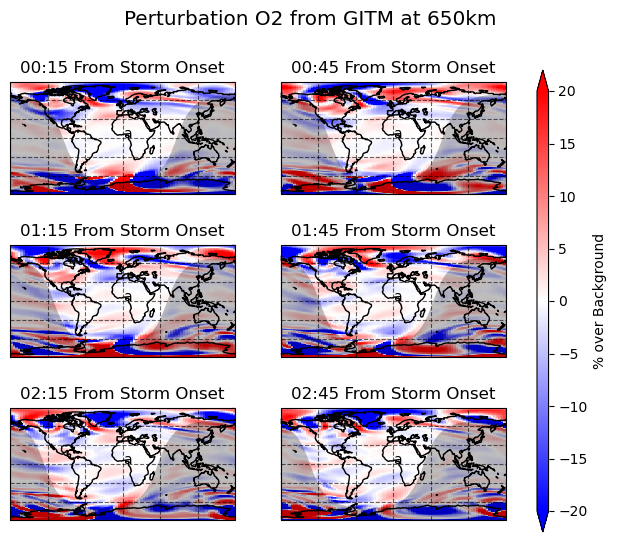

KeyboardInterrupt: 

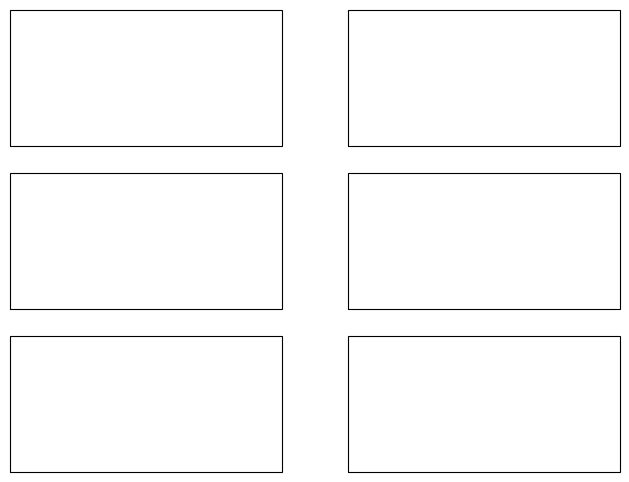

In [15]:
for i in l:
    for a in [150, 300, 500, 650]:
        dsa = gitmds[i].sel(alt=a, method='nearest')

        filtd = sosfiltfilt(sos, dsa, axis=0)

        ds = (100*(dsa-filtd)/dsa)


        plt.close('all')

        fig, axs = plt.subplots(3, 2, figsize=(8, 6), subplot_kw={
            'projection': ccrs.PlateCarree()},
                               sharex=True,
                               sharey=True)

        # plotting...
        # Setup some things...
        tnow = plot_start
        t = 0


        axes = axs.flatten()

        while tnow < plot_start + plot_delta * numplots:
            im = ds.sel(time=tnow, method='nearest').plot(x='lon', transform=ccrs.PlateCarree(),
                                                     vmin=-20,
                                                     vmax=20,
                                                     ax=axes[t],
                                                     add_colorbar=False,
                                                     cmap='bwr'
                                                     )


            axes[t].set_title("%s From Storm Onset"%timedeltatotime(tnow-storm_start), fontsize='x-large')
            axes[t].coastlines(zorder=3, color='black', alpha=1)
            axes[t].gridlines(color='black', linestyle='--',
                                    alpha=0.6, draw_labels=False)

            axes[t].add_feature(Nightshade(tnow, alpha = 0.25))

            axes[t].text(0,0,'a')

            tnow += plot_delta
            t += 1


        fig.suptitle("Perturbation %s from GITM at %ikm" %(i,int(a)),
                    fontsize='x-large')


        fig.colorbar(im, ax=axs.ravel().tolist(), orientation="vertical",
                     label = '% over Background', aspect=40, extend='both')

        plt.show()
